In [1]:
import numpy as np
import det_prob_plot as det
import matplotlib.pyplot as plt
from matplotlib import colors as mcolors

c:\Users\bryce\anaconda3\Lib\site-packages\paramiko\transport.py:219: CryptographyDeprecationWarning: Blowfish has been deprecated and will be removed in a future release
  "class": algorithms.Blowfish,


species v0.8.3

Working folder: c:\Users\bryce\High_Contrast_Imaging

Configuration file: c:\Users\bryce\High_Contrast_Imaging\species_config.ini
Database file: c:\Users\bryce\High_Contrast_Imaging\species_database.hdf5
Data folder: c:\Users\bryce\High_Contrast_Imaging\data

Configuration settings:
   - Database: c:\Users\bryce\High_Contrast_Imaging\species_database.hdf5
   - Data folder: c:\Users\bryce\High_Contrast_Imaging\data
   - Magnitude of Vega: 0.03

Multiprocessing: mpi4py installed
Process number 1 out of 1...


In [6]:
model = 'atmo'
model_tag = 'atmo-ceq'
foldername = 'C:/Users/bryce/High_Contrast_Imaging/METIS_2023/exeter/fits'
file_list = ['cc_adi_bckg1_mag7_L_CVC_exeter_all_effects.fits',
             'cc_adi_bckg1_mag7.5_L_CVC_exeter_all_effects.fits',
             'cc_adi_bckg1_mag8_L_CVC_exeter_all_effects.fits'
             ]
file_mag_list = [7,7.5,8]
stellar_mag_list = [7.93,
7.462,
7.092,
7.198,
8.047,
7.667,
8.027,
8.461,
7.123,
#7.154,
8.18,
#7.125,
#6.77,
6.984,
7.767,
7.504,
8.025,
#6.987
]
star_list = ['2MASS J00172353-6645124',
'TYC 8728 2262 1',
'HIP 86598',
'HIP 89829',
'TYC 9073 0762 1',
'TYC 7408 0054 1',
'TYC 7443 1102 1',
'2M J2001-3313',
'TYC 9340 0437 1',
#'HIP 112312',
'TWA 6',
#'TWA 7',
#'TYC_5832_0666_1',
'HIP 29964',
'HD 286264',
'TWA 25',
'TWA 23',
#'TWA 5'
]
filter_name_list = ['MKO_Lp']*14
band_list = ['L']*14
savefolder = 'C:/Users/bryce/High_Contrast_Imaging/METIS_2024/bpic_twa'
distance = [36.8,
67.8,
65.7,
79.4,
50.6,
49.6,
51.2,
60,
36.7,
#20.9,
65.6,
#34,
#28,
39.2,
53.4,
53.6,
56.8,
#49.7
]
age = [24,
24,
24,
24,
24,
24,
24,
24,
24,
#24,
10,
#10,
#24,
24,
24,
10,
10,
#10
]

Unpacking ATMO isochrones (9.6 MB)... [DONE]
Adding isochrones: ATMO equilibrium chemistry... [DONE]
Database tag: atmo-ceq
Adding isochrones: ATMO non-equilibrium chemistry (weak)... [DONE]
Database tag: atmo-neq-weak
Adding isochrones: ATMO non-equilibrium chemistry (strong)... [DONE]
Database tag: atmo-neq-strong
[ 0.70343779  0.9047338   1.10602981  1.30732582  1.50862182  1.70991783
  1.91121384  2.11250985  2.31380585  2.51510186  2.71639787  2.91769388
  3.11898988  3.32028589  3.5215819   3.72287791  3.92417392  4.12546992
  4.32676593  4.52806194  4.72935767  4.93065395  5.13194969  5.33324597
  5.5345417   5.73583798  5.93713372  6.13843     6.33972573  6.54102201
  6.74231775  6.94361403  7.14490976  7.34620605  7.54750178  7.74879806
  7.95009379  8.15139008  8.35268581  8.55398154  8.75527782  8.95657356
  9.15786984  9.35916557  9.56046185  9.76175814  9.96305332 10.1643496
 10.36564589 10.56694217 10.76823735 10.96953363 11.17082992 11.3721262
 11.57342138 11.77471766 11

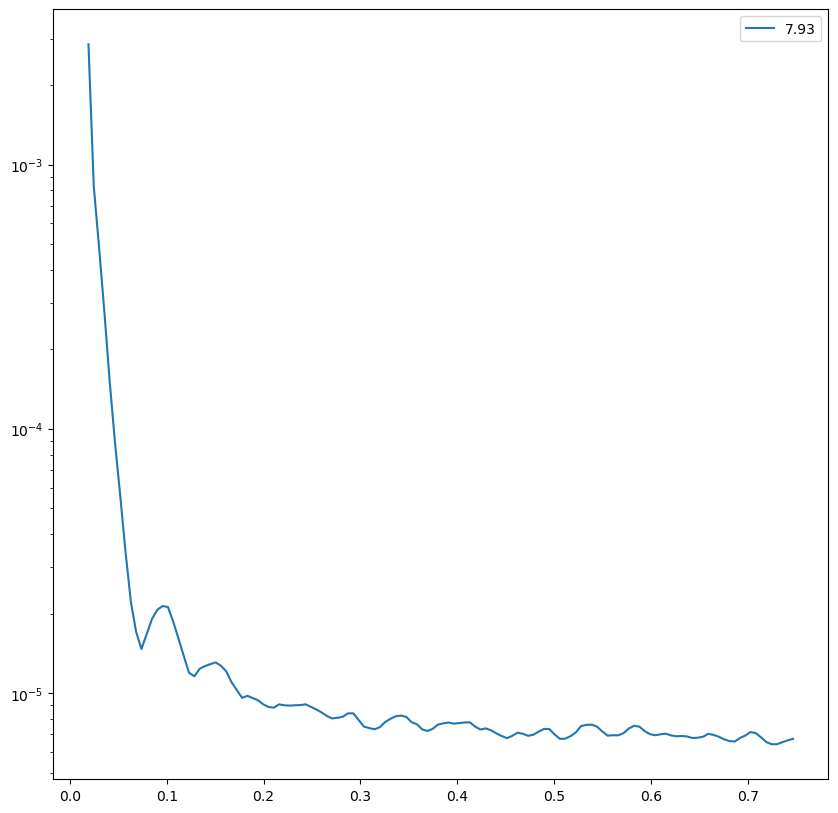

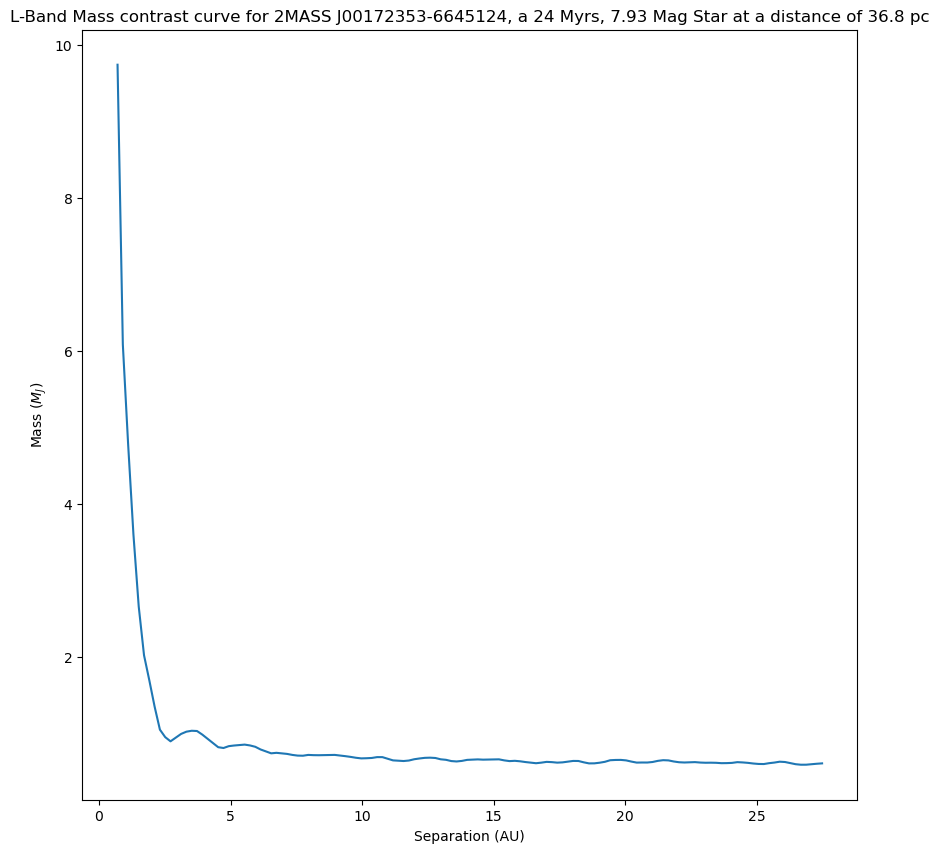

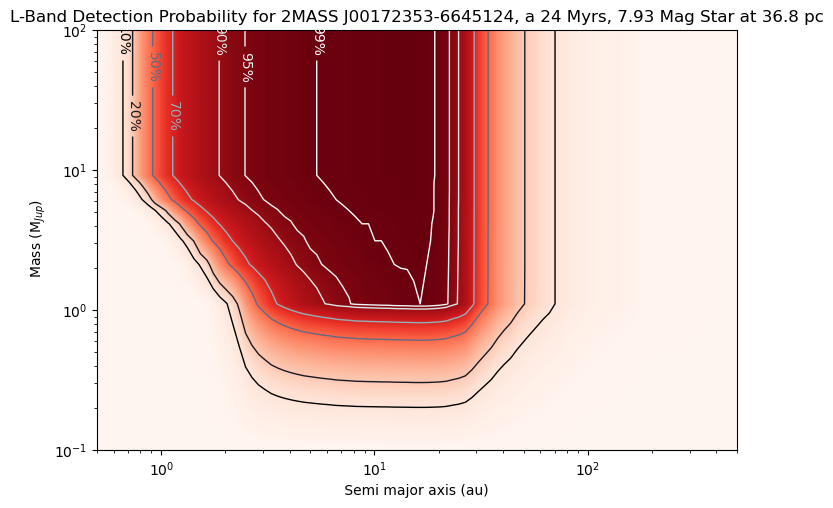

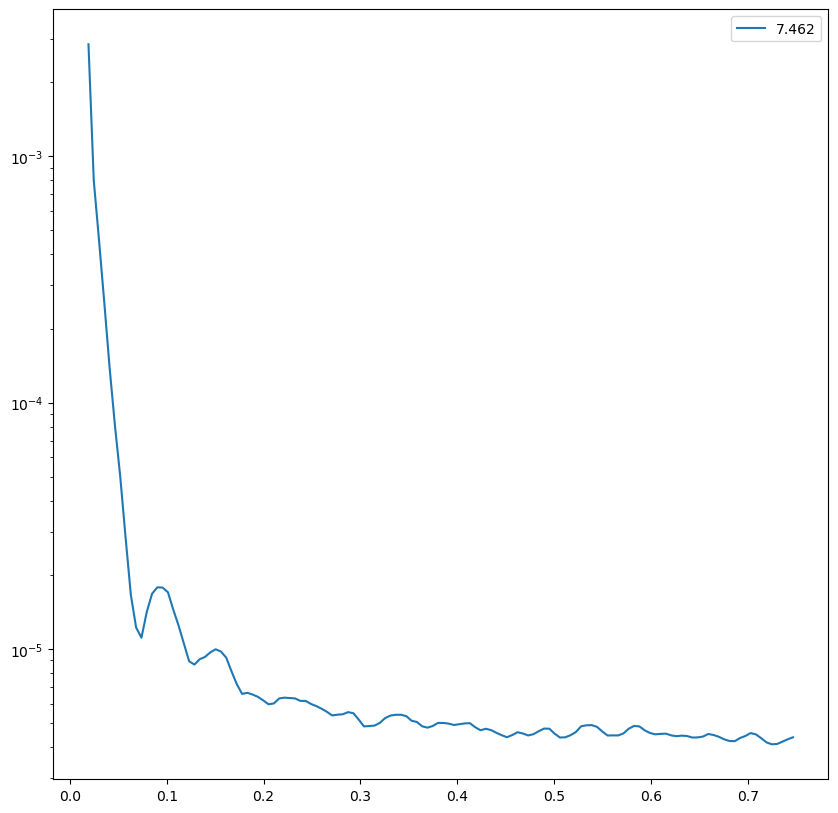

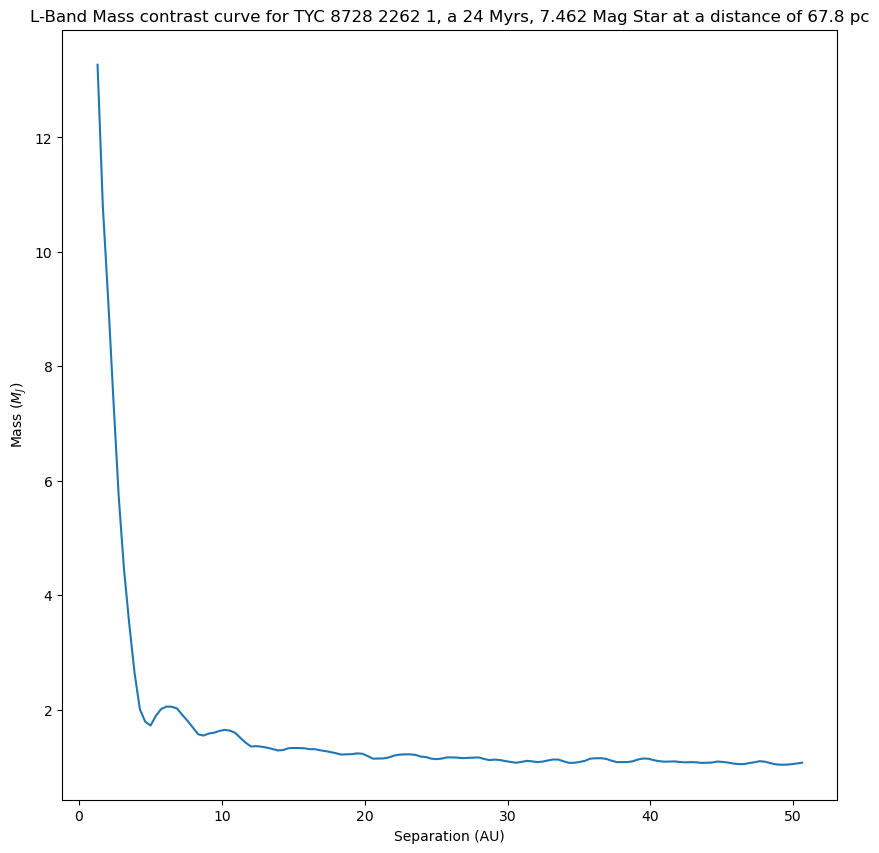

...

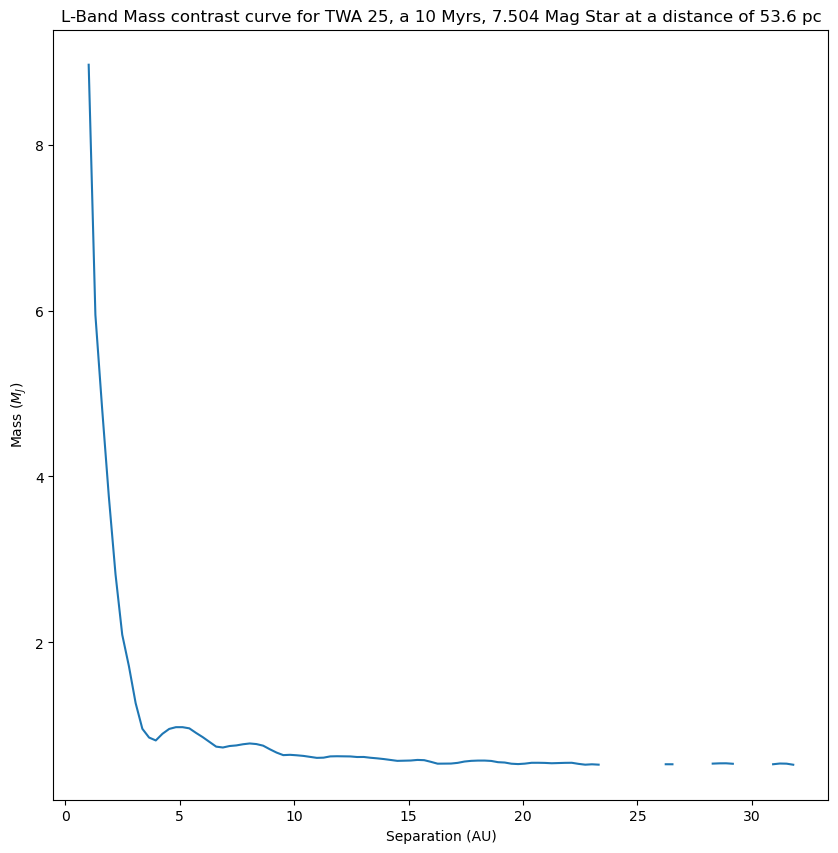

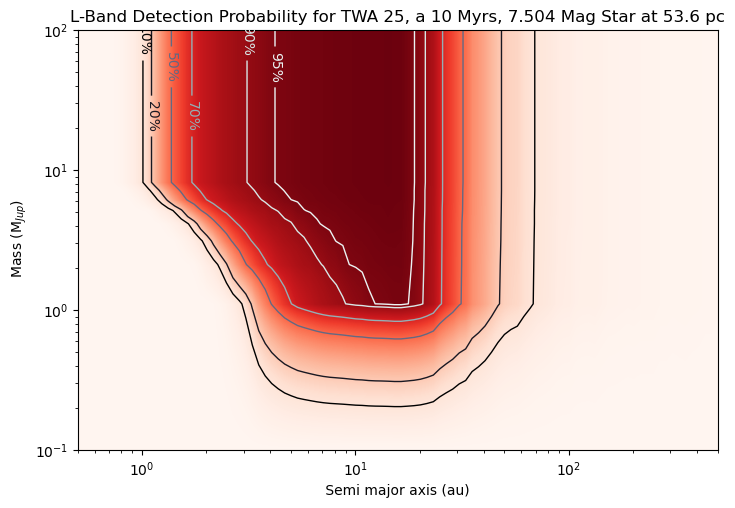

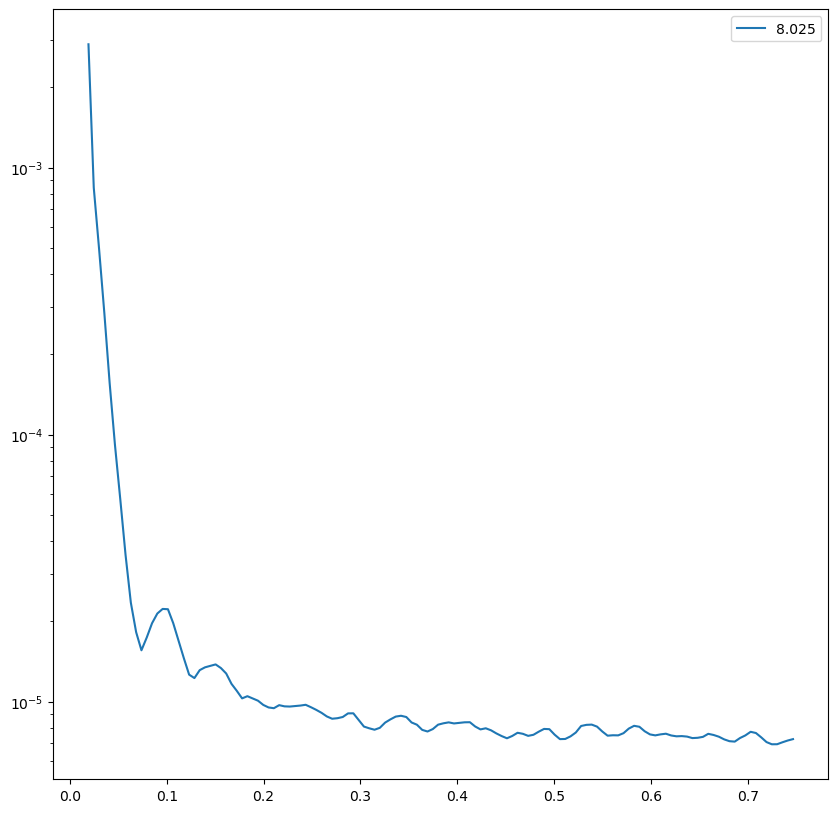

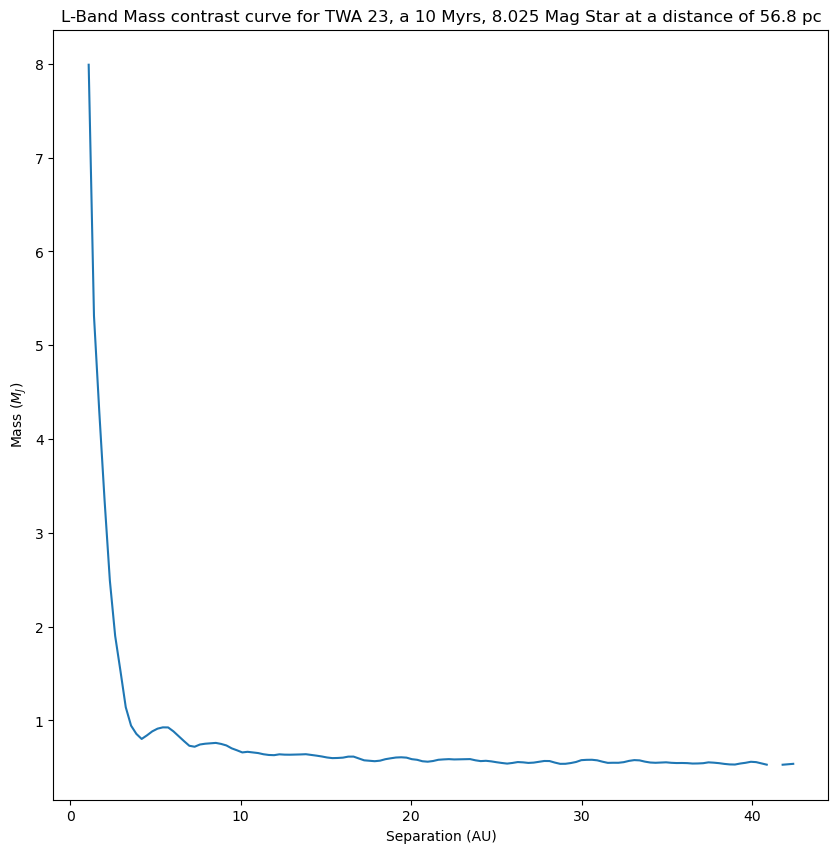

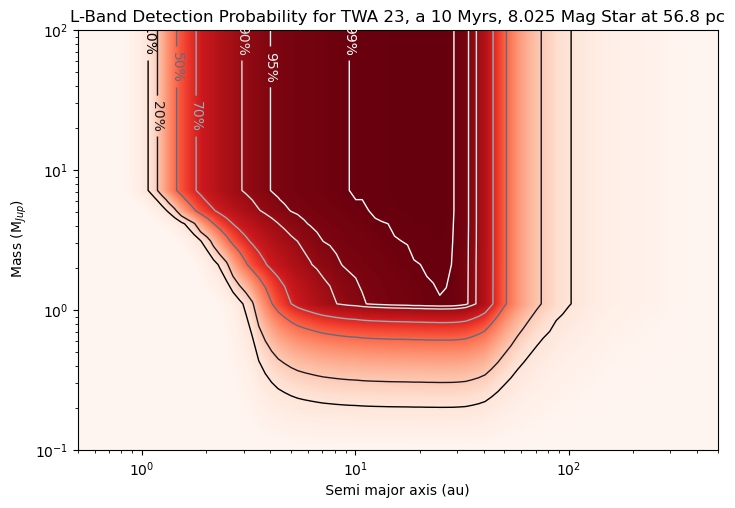

In [7]:
det.plot(model, model_tag, foldername, file_list, file_mag_list, distance, age, stellar_mag_list, filter_name_list, band_list, savefolder, star_list = star_list, xmin = 0.5, xmax = 500, logx = True)

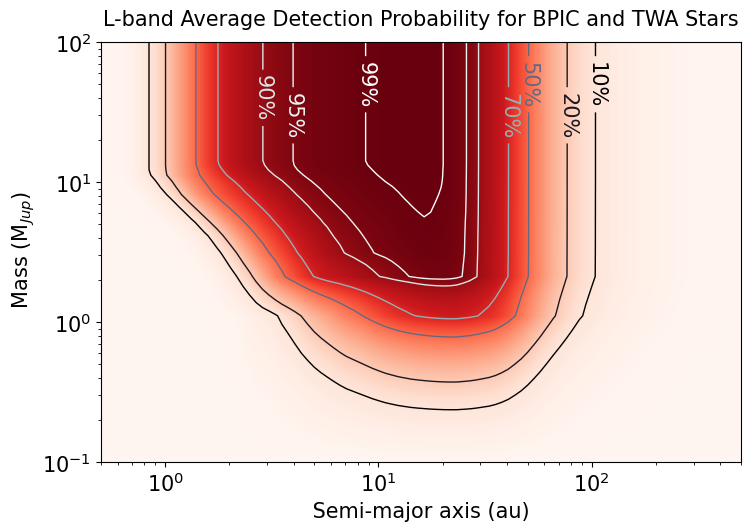

In [13]:
d = 0
for i in star_list:
    d += np.array(np.genfromtxt('C:/Users/bryce/High_Contrast_Imaging/METIS_2024/bpic_twa_L/{}_MKO_Lp_band_detprob.txt'.format(i)))
map = d/len(star_list)

savefilename = 'average_BPIC_TWA_MKO_Lp_band'
savefolder = 'C:/Users/bryce/High_Contrast_Imaging/METIS_2024/average/'

fig = plt.figure(figsize=(8, 6))

sma = np.geomspace(0.5, 500, 100)
m2 = np.linspace(0.1, 100, 100)

ax = fig.add_axes([0.15, 0.15, 0.8, 0.7])
ax.set_xscale('log')
ax.set_yscale('log')
ax.set_ylabel(" Mass (M$_{Jup}$)", size = 15)
ax.set_xlabel(" Semi-major axis (au) ", size = 15)
#ax.grid(which = 'major', color = 'black')
#ax.grid(which = 'minor', color = 'gray', linestyle = '--')

levels=[10,20,50,70,90,95,99,100]
norm = mcolors.Normalize(0, 100)
cf0=ax.contourf(sma, m2, map.T*100, norm=norm, levels=np.arange(0,100,0.1), extend='neither', cmap='Reds', antialiased=False, zorder=0)
contours = plt.contour(sma, m2, map.T*100, levels, cmap='bone', zorder=1, linewidths=1)
locations = [(100,50),(70,30),(60,50),(40,30),(4,30),(8,50),(3,40)]
ax.clabel(contours, contours.levels, fmt = {10:'10%',20:'20%',50:'50%',70:'70%',90:'90%',95:'95%',99:'99%',100:'100%'}, inline=True, fontsize=15, manual = locations)
ax.set_title('L-band Average Detection Probability for BPIC and TWA Stars', size = 15, y = 1.02)
ax.tick_params(axis='both', which='major', labelsize=15)
plt.savefig(str(savefolder)+'/'+str(savefilename)+'_detprob.png', bbox_inches='tight')

In [19]:
model = 'atmo'
model_tag = 'atmo-ceq'
foldername = 'C:/Users/bryce/High_Contrast_Imaging/METIS_2023/exeter/fits'
file_list = ['cc_adi_bckg1_mag7_L_CVC_exeter_all_effects.fits',
             'cc_adi_bckg1_mag7.5_L_CVC_exeter_all_effects.fits',
             'cc_adi_bckg1_mag8_L_CVC_exeter_all_effects.fits'
             ]
file_mag_list = [7,7.5,8]
stellar_mag_list = [7.93,
7.462,
7.092,
7.198,
8.047,
7.667,
8.027,
8.461,
7.123,
7.154,
8.18,
7.125,
6.77,
6.984,
7.767,
7.504,
8.025,
6.987
]
star_list = ['2MASS J00172353-6645124',
'TYC 8728 2262 1',
'HIP 86598',
'HIP 89829',
'TYC 9073 0762 1',
'TYC 7408 0054 1',
'TYC 7443 1102 1',
'2M J2001-3313',
'TYC 9340 0437 1',
'HIP 112312',
'TWA 6',
'TWA 7',
'TYC_5832_0666_1',
'HIP 29964',
'HD 286264',
'TWA 25',
'TWA 23',
'TWA 5'
]
filter_name_list = ['MKO_Lp']*18
band_list = ['L']*18
savefolder = 'C:/Users/bryce/High_Contrast_Imaging/METIS_2024/bpic_twa_L-with_close'
distance = [36.8,
67.8,
65.7,
79.4,
50.6,
49.6,
51.2,
60,
36.7,
20.9,
65.6,
34,
28,
39.2,
53.4,
53.6,
56.8,
49.7
]
age = [24,
24,
24,
24,
24,
24,
24,
24,
24,
24,
10,
10,
24,
24,
24,
10,
10,
10
]

Unpacking ATMO isochrones (9.6 MB)... [DONE]
Adding isochrones: ATMO equilibrium chemistry... [DONE]
Database tag: atmo-ceq
Adding isochrones: ATMO non-equilibrium chemistry (weak)... [DONE]
Database tag: atmo-neq-weak
Adding isochrones: ATMO non-equilibrium chemistry (strong)... [DONE]
Database tag: atmo-neq-strong
[ 0.70343779  0.9047338   1.10602981  1.30732582  1.50862182  1.70991783
  1.91121384  2.11250985  2.31380585  2.51510186  2.71639787  2.91769388
  3.11898988  3.32028589  3.5215819   3.72287791  3.92417392  4.12546992
  4.32676593  4.52806194  4.72935767  4.93065395  5.13194969  5.33324597
  5.5345417   5.73583798  5.93713372  6.13843     6.33972573  6.54102201
  6.74231775  6.94361403  7.14490976  7.34620605  7.54750178  7.74879806
  7.95009379  8.15139008  8.35268581  8.55398154  8.75527782  8.95657356
  9.15786984  9.35916557  9.56046185  9.76175814  9.96305332 10.1643496
 10.36564589 10.56694217 10.76823735 10.96953363 11.17082992 11.3721262
 11.57342138 11.77471766 11

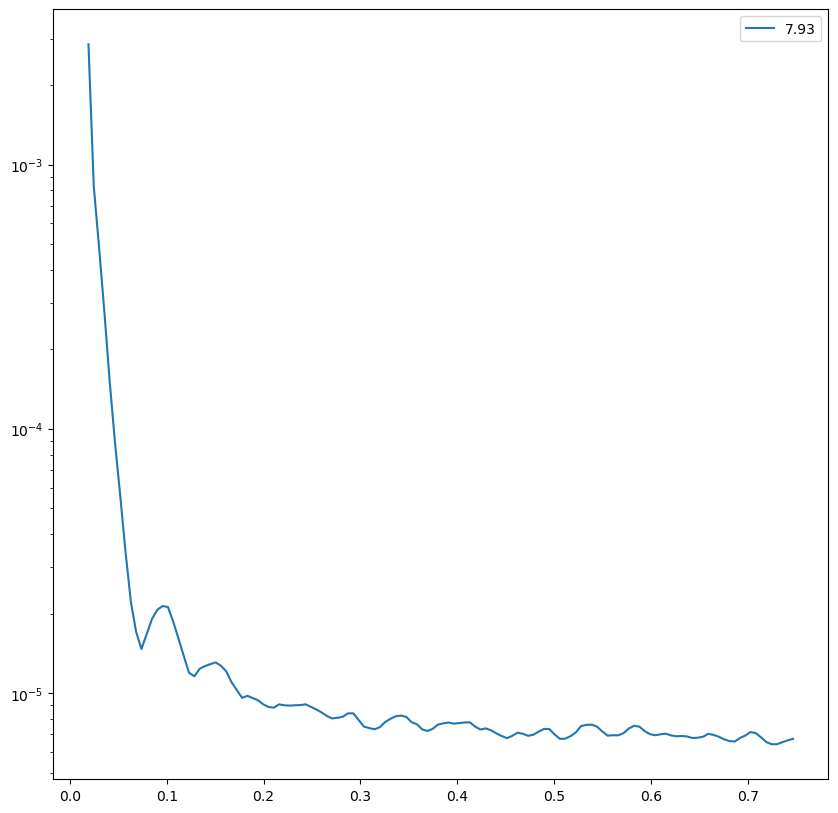

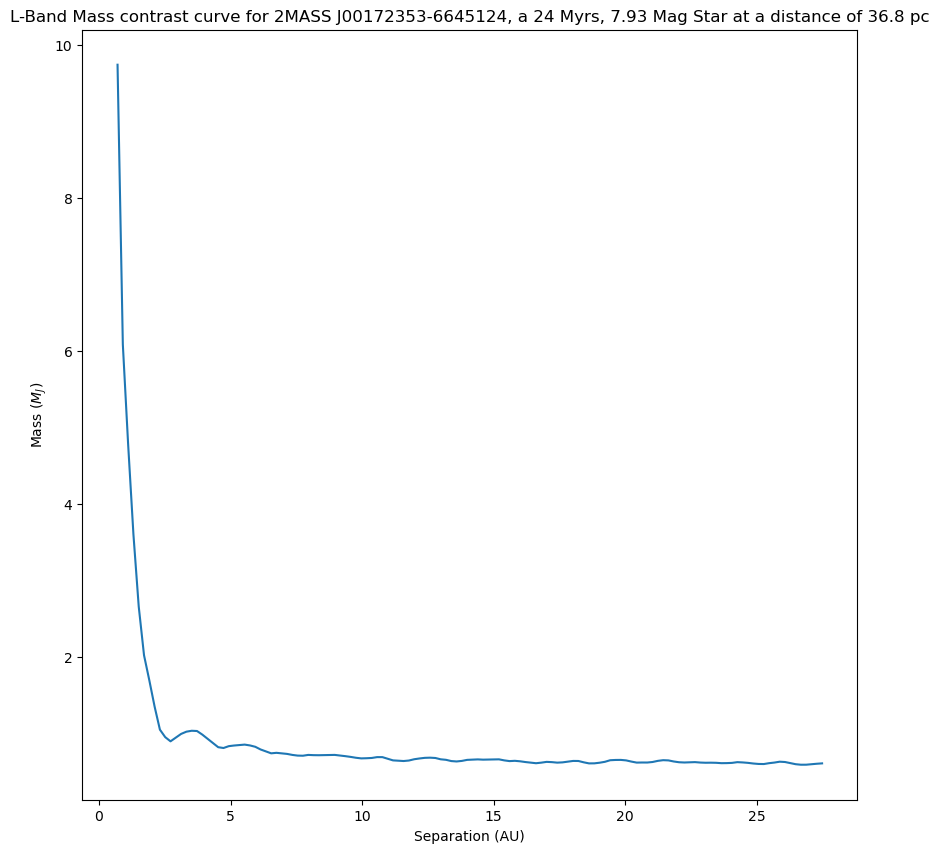

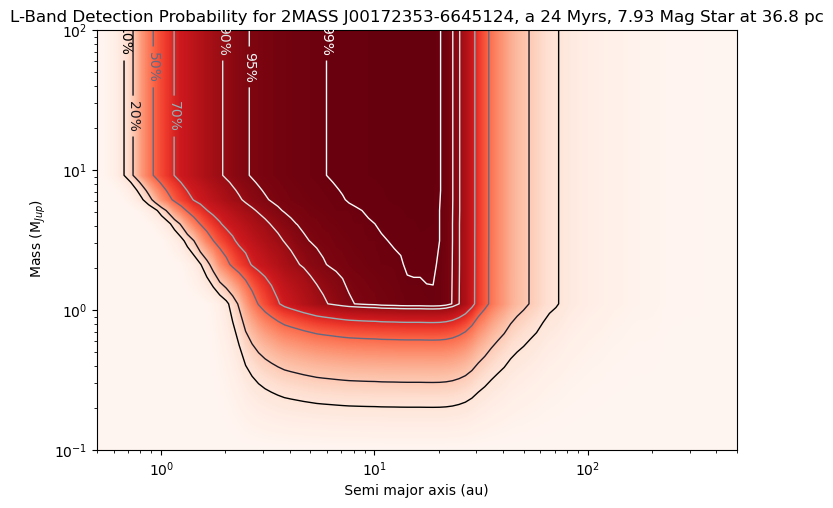

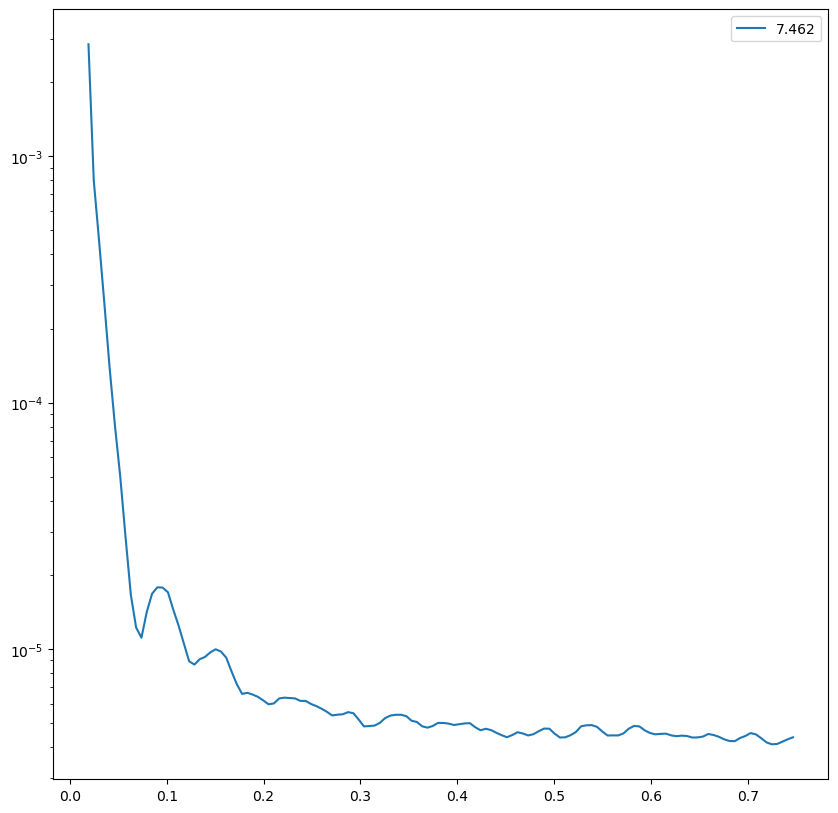

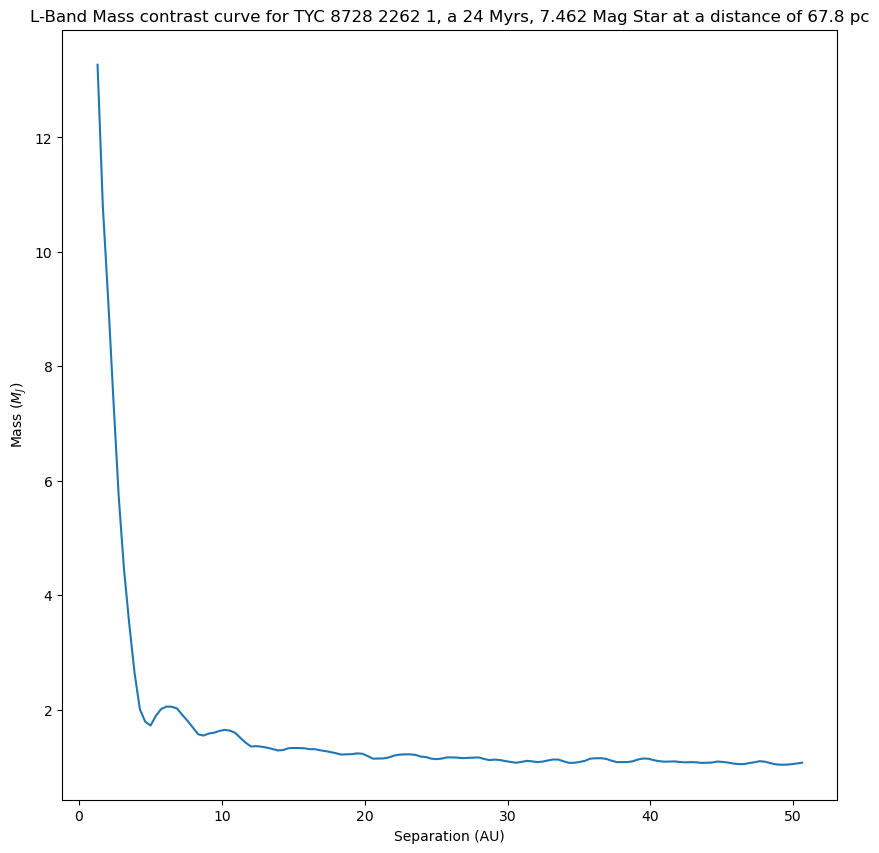

...

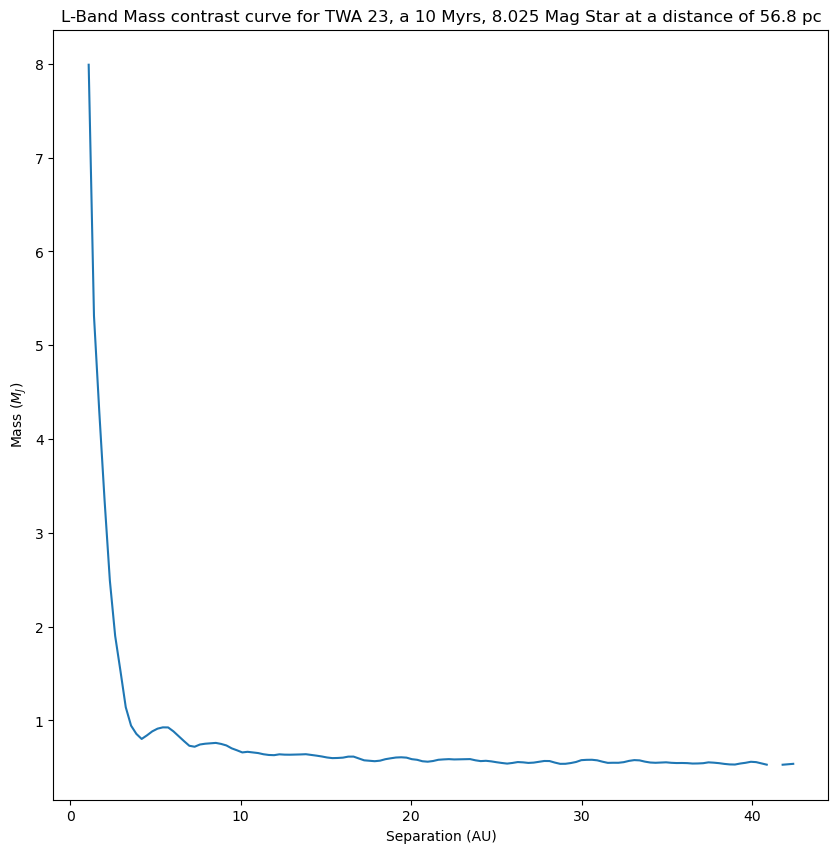

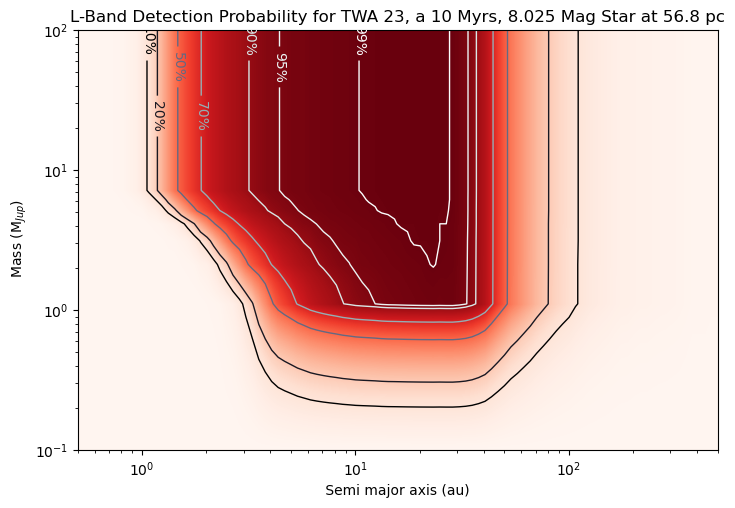

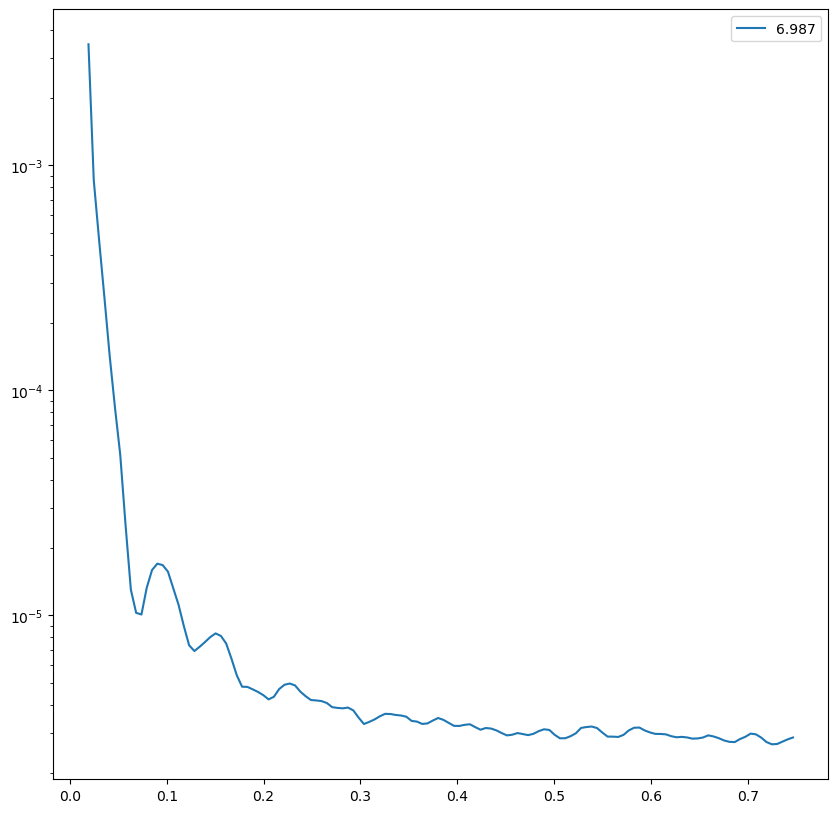

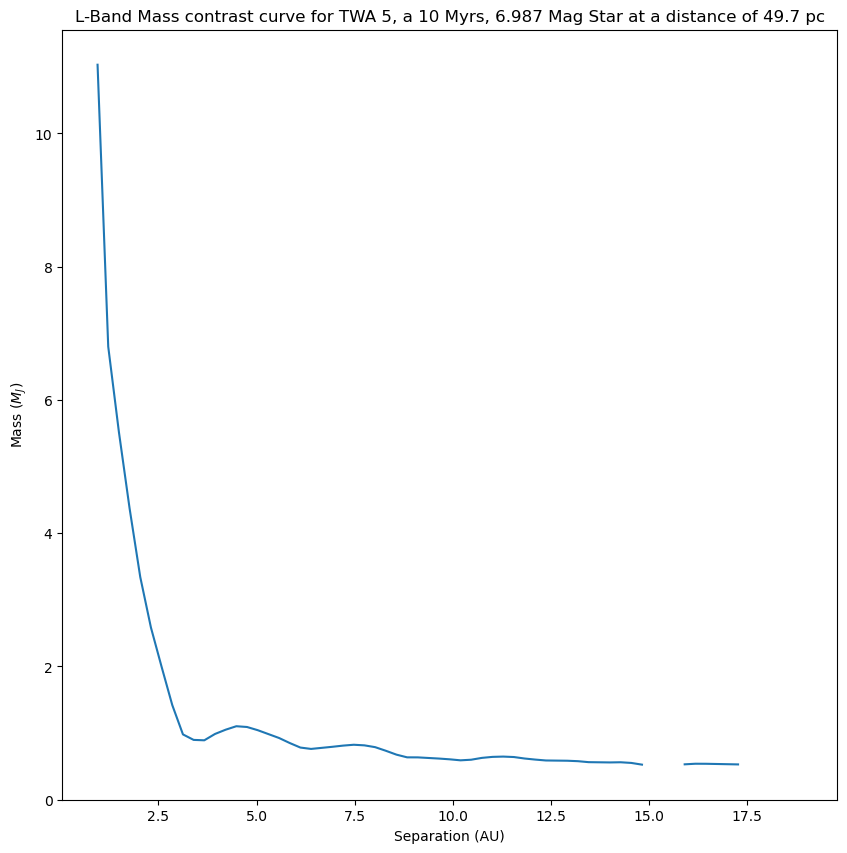

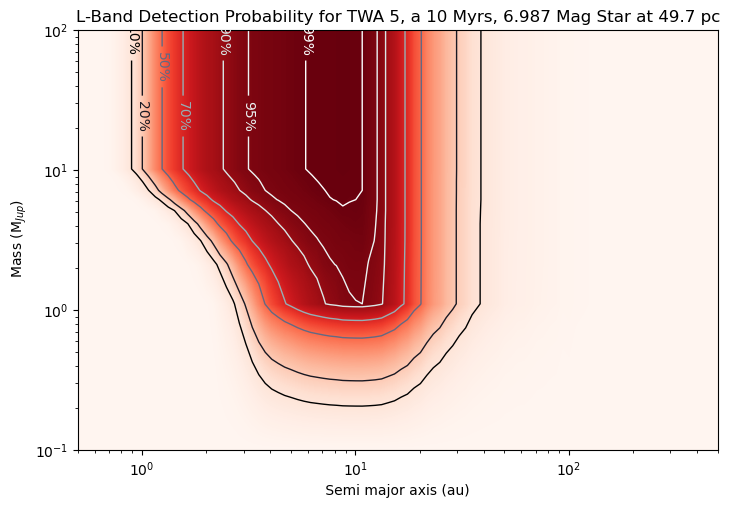

In [20]:
det.plot(model, model_tag, foldername, file_list, file_mag_list, distance, age, stellar_mag_list, filter_name_list, band_list, savefolder, star_list = star_list, xmin = 0.5, xmax = 500, logx = True)

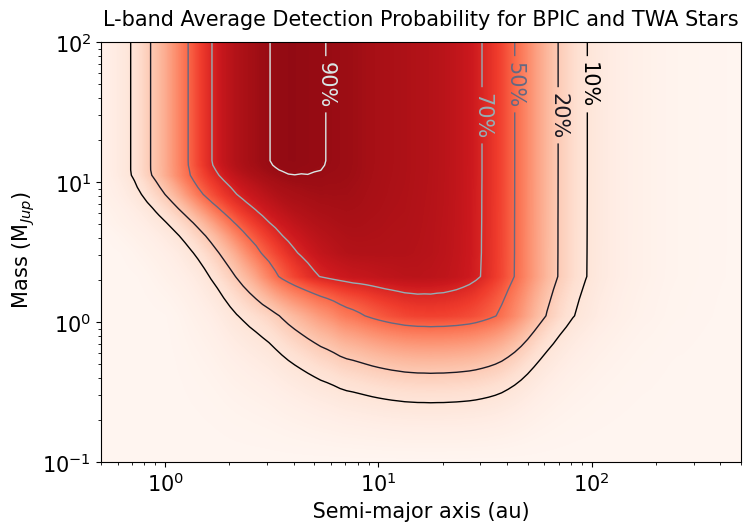

In [22]:
d = 0
for i in star_list:
    d += np.array(np.genfromtxt('C:/Users/bryce/High_Contrast_Imaging/METIS_2024/bpic_twa_L-with_close/{}_MKO_Lp_band_detprob.txt'.format(i)))
map = d/len(star_list)

savefilename = 'average_BPIC_TWA_MKO_Lp_band-with_close'
savefolder = 'C:/Users/bryce/High_Contrast_Imaging/METIS_2024/average/'

fig = plt.figure(figsize=(8, 6))

sma = np.geomspace(0.5, 500, 100)
m2 = np.linspace(0.1, 100, 100)

ax = fig.add_axes([0.15, 0.15, 0.8, 0.7])
ax.set_xscale('log')
ax.set_yscale('log')
ax.set_ylabel(" Mass (M$_{Jup}$)", size = 15)
ax.set_xlabel(" Semi-major axis (au) ", size = 15)
#ax.grid(which = 'major', color = 'black')
#ax.grid(which = 'minor', color = 'gray', linestyle = '--')

levels=[10,20,50,70,90,95,99,100]
norm = mcolors.Normalize(0, 100)
cf0=ax.contourf(sma, m2, map.T*100, norm=norm, levels=np.arange(0,100,0.1), extend='neither', cmap='Reds', antialiased=False, zorder=0)
contours = plt.contour(sma, m2, map.T*100, levels, cmap='bone', zorder=1, linewidths=1)
locations = [(100,50),(70,30),(40,50),(20,30),(8,50)]
ax.clabel(contours, contours.levels, fmt = {10:'10%',20:'20%',50:'50%',70:'70%',90:'90%',95:'95%',99:'99%',100:'100%'}, inline=True, fontsize=15, manual = locations)
ax.set_title('L-band Average Detection Probability for BPIC and TWA Stars', size = 15, y = 1.02)
ax.tick_params(axis='both', which='major', labelsize=15)
plt.savefig(str(savefolder)+'/'+str(savefilename)+'_detprob.png', bbox_inches='tight')

In [14]:
model = 'atmo'
model_tag = 'atmo-ceq'
foldername = 'C:/Users/bryce/High_Contrast_Imaging/METIS_2023/exeter/fits'
file_list = ['cc_adi_bckg1_mag7_M_CVC_exeter_all_effects.fits',
             'cc_adi_bckg1_mag7.5_M_CVC_exeter_all_effects.fits',
             'cc_adi_bckg1_mag8_M_CVC_exeter_all_effects.fits'
             ]
file_mag_list = [7,7.5,8]
stellar_mag_list = [7.93,
7.462,
7.092,
7.198,
8.047,
7.667,
8.027,
8.461,
7.123,
#7.154,
8.18,
#7.125,
#6.77,
6.984,
7.767,
7.504,
8.025,
#6.987
]
star_list = ['2MASS J00172353-6645124',
'TYC 8728 2262 1',
'HIP 86598',
'HIP 89829',
'TYC 9073 0762 1',
'TYC 7408 0054 1',
'TYC 7443 1102 1',
'2M J2001-3313',
'TYC 9340 0437 1',
#'HIP 112312',
'TWA 6',
#'TWA 7',
#'TYC_5832_0666_1',
'HIP 29964',
'HD 286264',
'TWA 25',
'TWA 23',
#'TWA 5'
]
filter_name_list = ['MKO_Mp']*14
band_list = ['M']*14
savefolder = 'C:/Users/bryce/High_Contrast_Imaging/METIS_2024/bpic_twa_M'
distance = [36.8,
67.8,
65.7,
79.4,
50.6,
49.6,
51.2,
60,
36.7,
#20.9,
65.6,
#34,
#28,
39.2,
53.4,
53.6,
56.8,
#49.7
]
age = [24,
24,
24,
24,
24,
24,
24,
24,
24,
#24,
10,
#10,
#24,
24,
24,
10,
10,
#10
]

Unpacking ATMO isochrones (9.6 MB)... [DONE]
Adding isochrones: ATMO equilibrium chemistry... [DONE]
Database tag: atmo-ceq
Adding isochrones: ATMO non-equilibrium chemistry (weak)... [DONE]
Database tag: atmo-neq-weak
Adding isochrones: ATMO non-equilibrium chemistry (strong)... [DONE]
Database tag: atmo-neq-strong
[ 0.88178921  1.08308515  1.28438122  1.48567723  1.68697324  1.88826911
  2.08956512  2.29086112  2.49215727  2.69345328  2.89474928  3.09604529
  3.2973413   3.49863731  3.69993304  3.90122905  4.10252506  4.30382106
  4.50511707  4.70641308  4.90770936  5.10900509  5.31030138  5.51159711
  5.71289339  5.91418912  6.11548541  6.31678114  6.51807742  6.71937315
  6.92066944  7.12196517  7.3232609   7.52455719  7.72585292  7.9271492
  8.12844493  8.32974122  8.53103695  8.73233323  8.93362896  9.13492525
  9.33622098  9.53751726  9.73881354  9.94010873 10.14140501 10.34270129
 10.54399757 10.74529276 10.94658904 11.14788532 11.3491816  11.55047679
 11.75177307 11.95306935 1

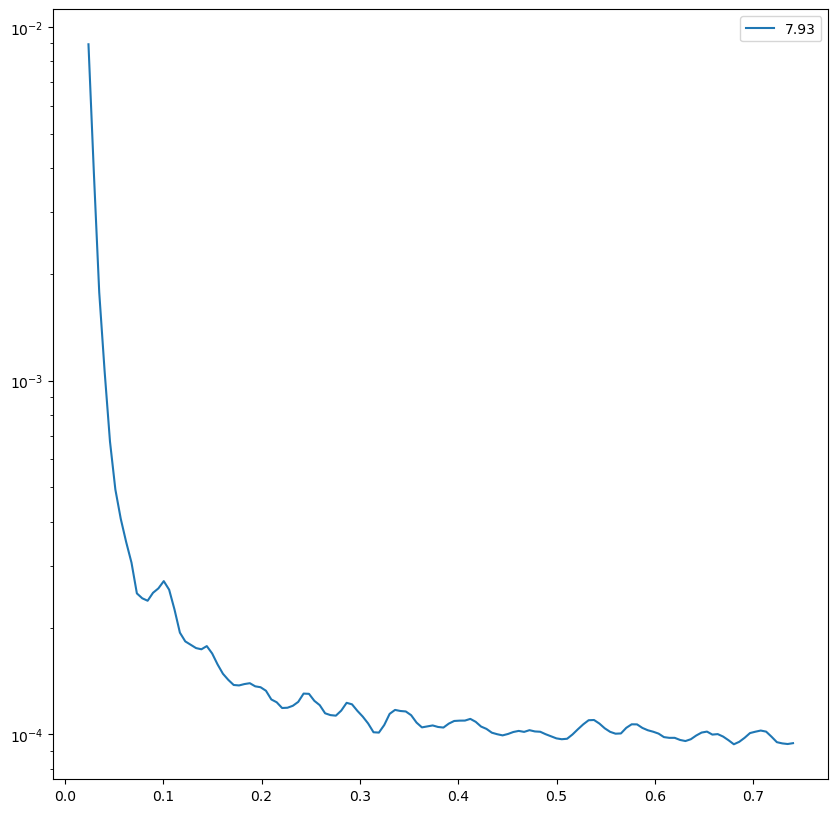

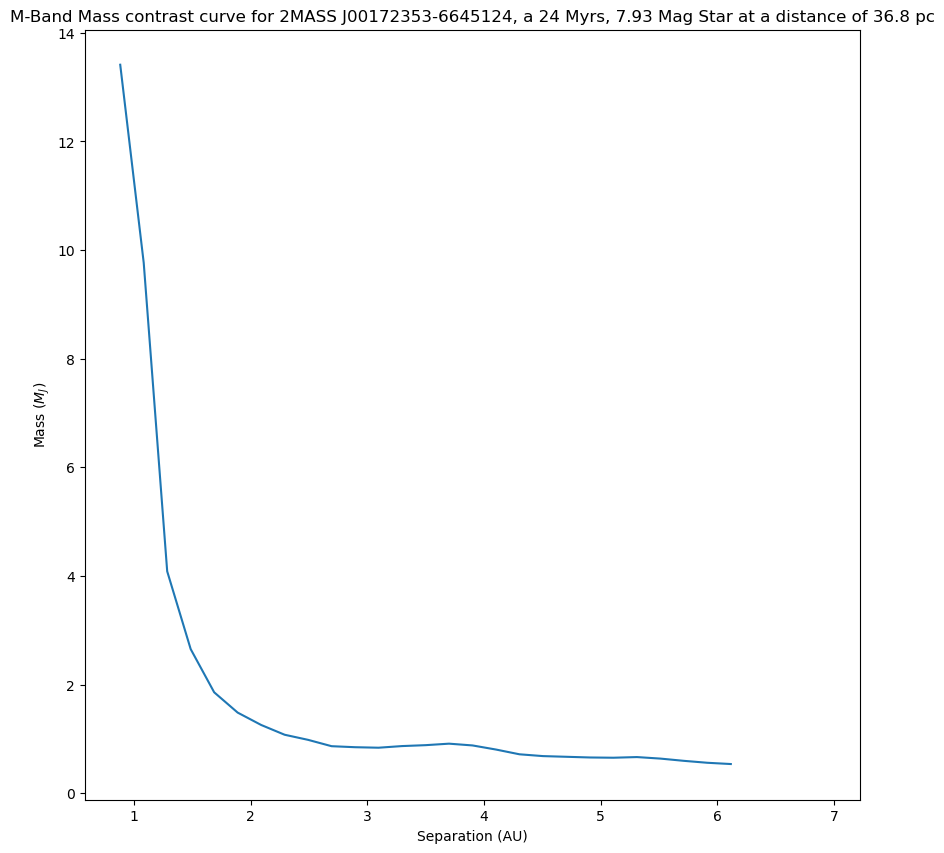

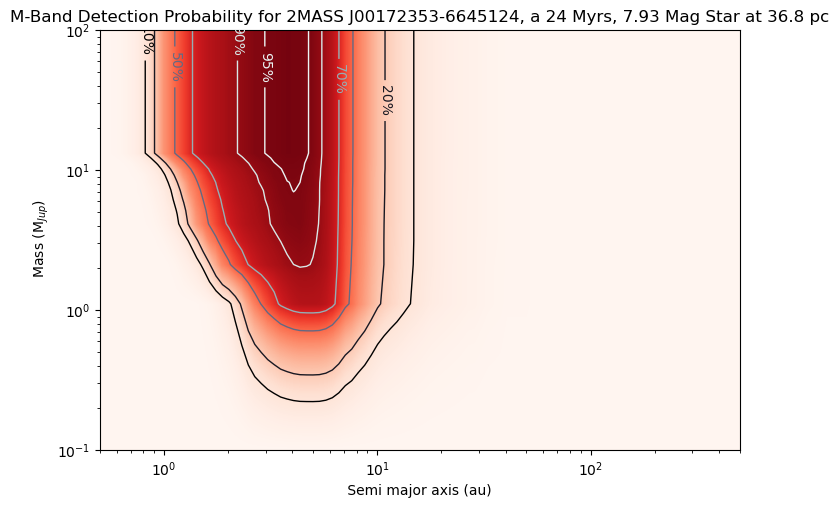

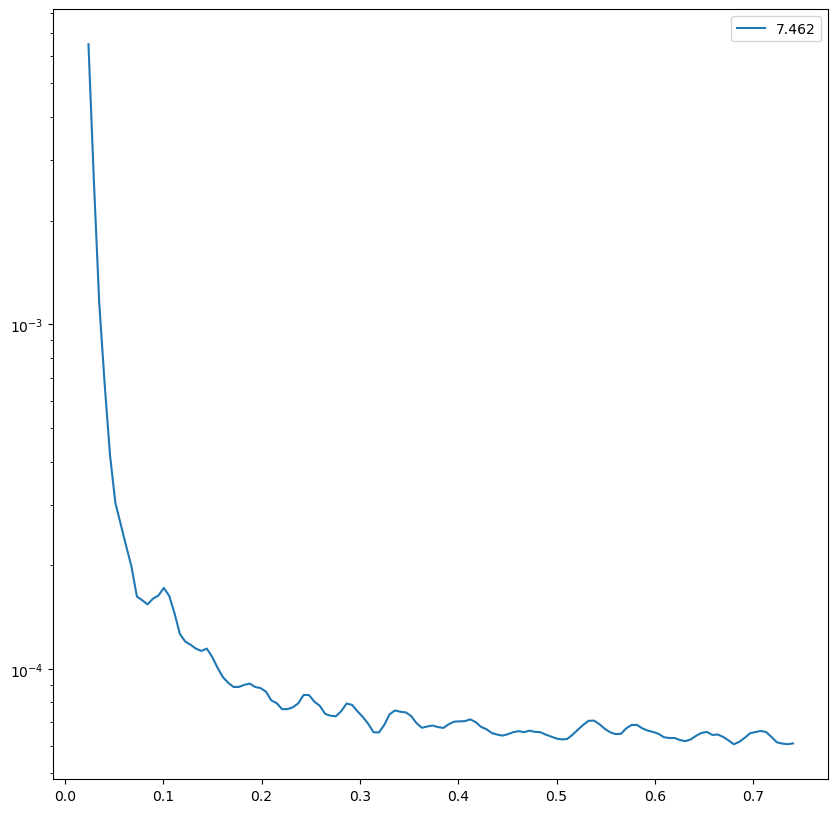

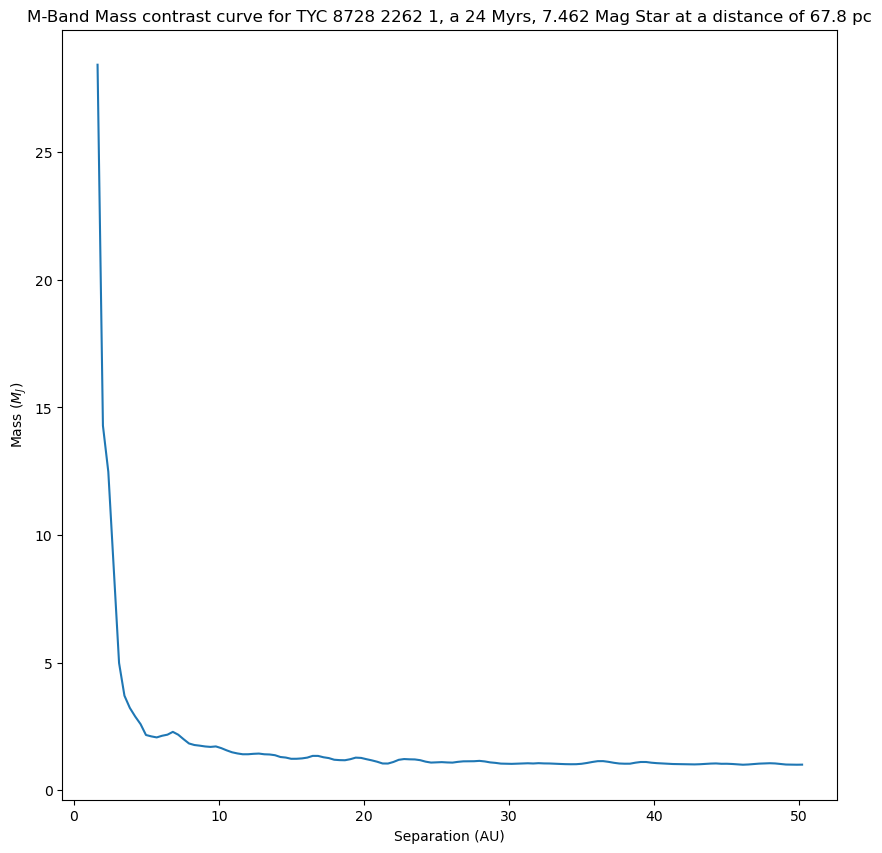

...

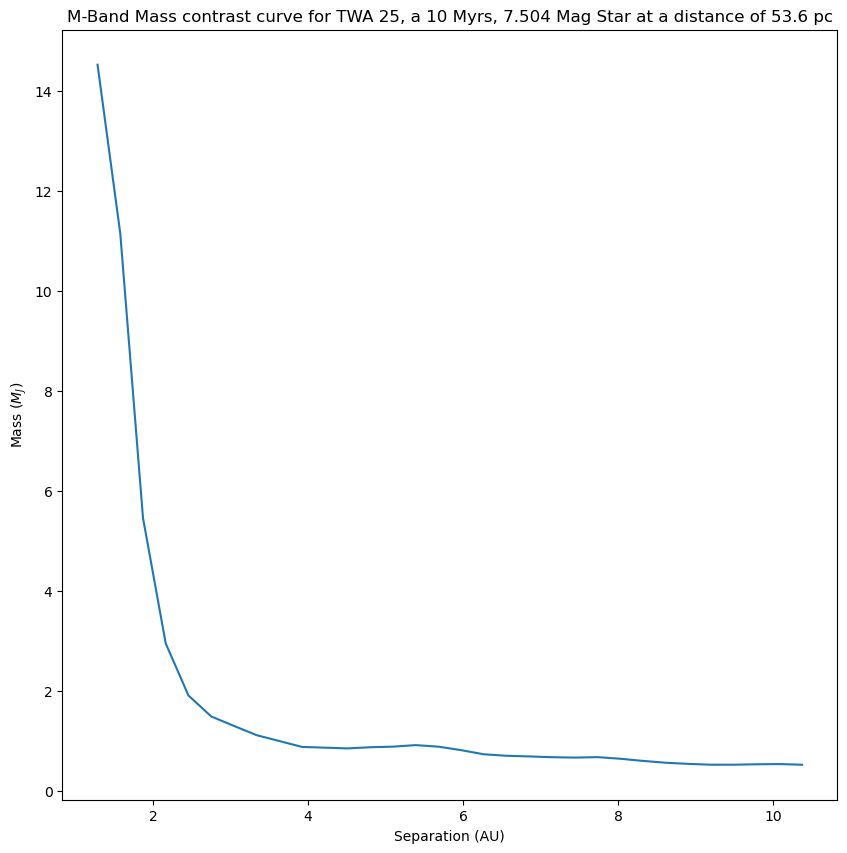

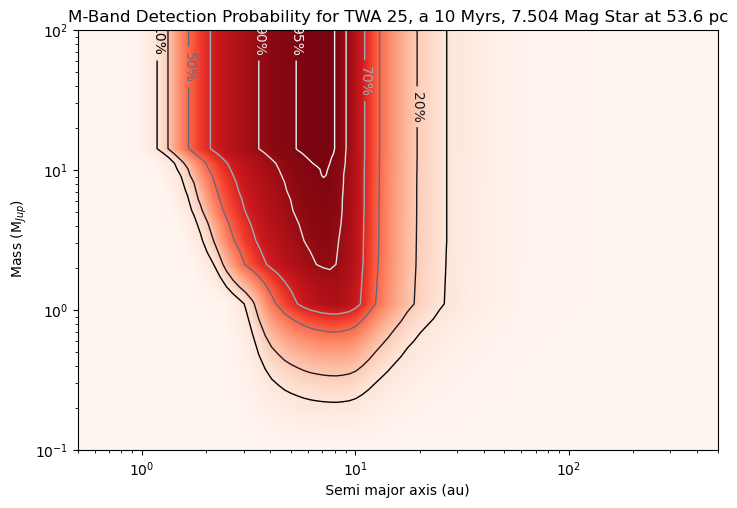

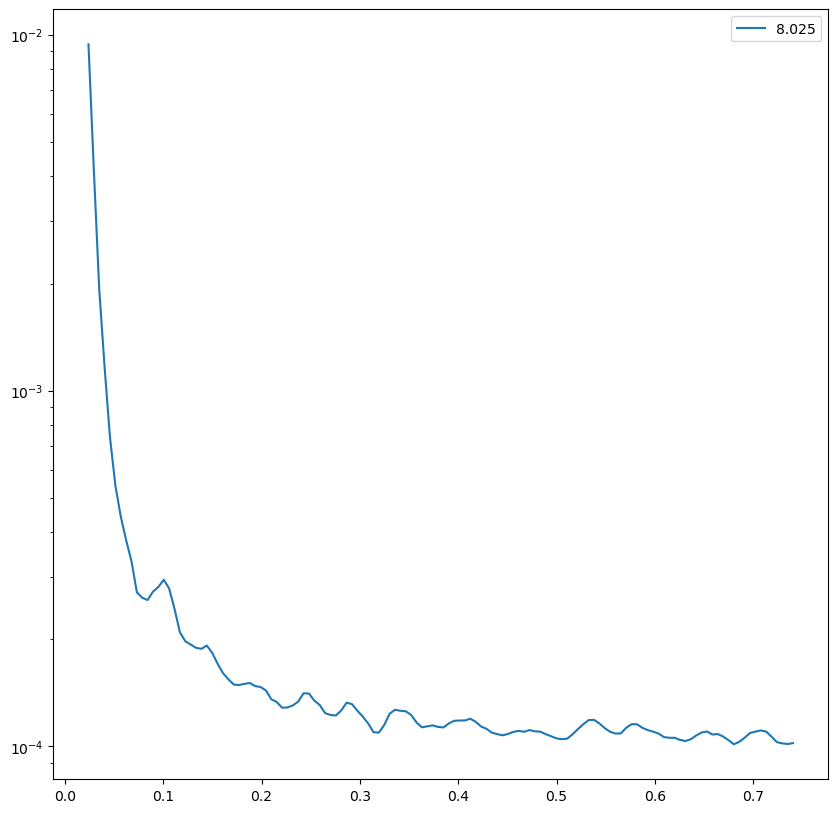

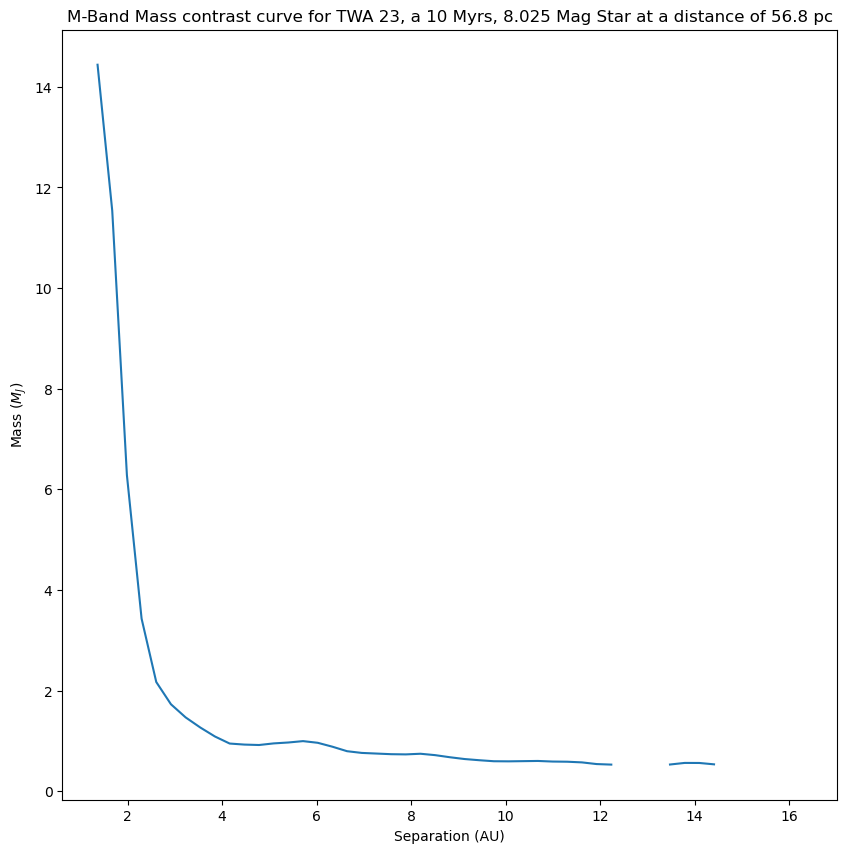

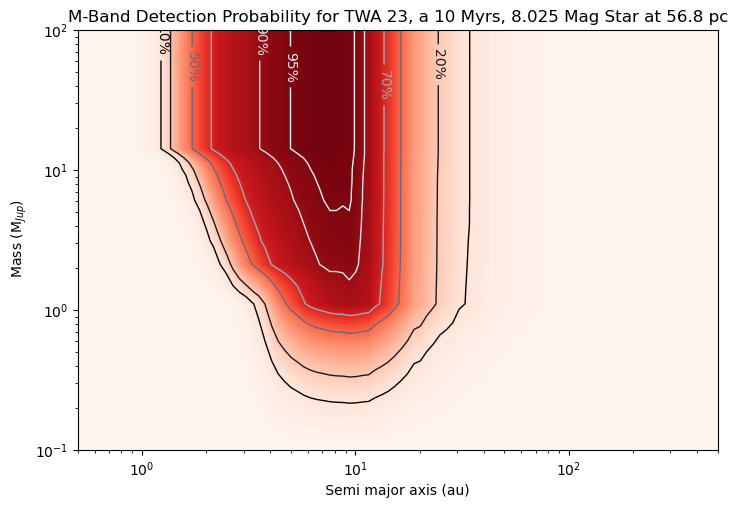

In [15]:
det.plot(model, model_tag, foldername, file_list, file_mag_list, distance, age, stellar_mag_list, filter_name_list, band_list, savefolder, star_list = star_list, xmin = 0.5, xmax = 500, logx = True)

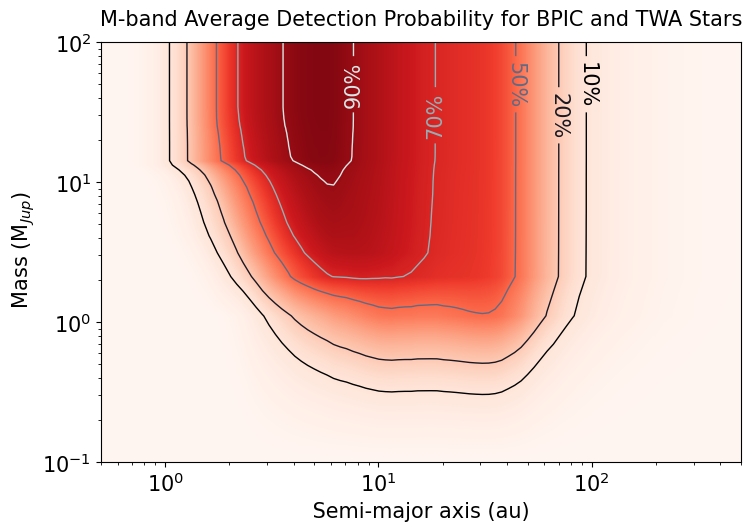

In [17]:
d = 0
for i in star_list:
    d += np.array(np.genfromtxt('C:/Users/bryce/High_Contrast_Imaging/METIS_2024/bpic_twa_M/{}_MKO_Mp_band_detprob.txt'.format(i)))
map = d/len(star_list)

savefilename = 'average_BPIC_TWA_MKO_Mp_band'
savefolder = 'C:/Users/bryce/High_Contrast_Imaging/METIS_2024/average/'

fig = plt.figure(figsize=(8, 6))

sma = np.geomspace(0.5, 500, 100)
m2 = np.linspace(0.1, 100, 100)

ax = fig.add_axes([0.15, 0.15, 0.8, 0.7])
ax.set_xscale('log')
ax.set_yscale('log')
ax.set_ylabel(" Mass (M$_{Jup}$)", size = 15)
ax.set_xlabel(" Semi-major axis (au) ", size = 15)
#ax.grid(which = 'major', color = 'black')
#ax.grid(which = 'minor', color = 'gray', linestyle = '--')

levels=[10,20,50,70,90,95,99,100]
norm = mcolors.Normalize(0, 100)
cf0=ax.contourf(sma, m2, map.T*100, norm=norm, levels=np.arange(0,100,0.1), extend='neither', cmap='Reds', antialiased=False, zorder=0)
contours = plt.contour(sma, m2, map.T*100, levels, cmap='bone', zorder=1, linewidths=1)
locations = [(100,50),(70,30),(40,50),(20,30),(8,50)]
ax.clabel(contours, contours.levels, fmt = {10:'10%',20:'20%',50:'50%',70:'70%',90:'90%',95:'95%',99:'99%',100:'100%'}, inline=True, fontsize=15, manual = locations)
ax.set_title('M-band Average Detection Probability for BPIC and TWA Stars', size = 15, y = 1.02)
ax.tick_params(axis='both', which='major', labelsize=15)
plt.savefig(str(savefolder)+'/'+str(savefilename)+'_detprob.png', bbox_inches='tight')

In [23]:
model = 'atmo'
model_tag = 'atmo-ceq'
foldername = 'C:/Users/bryce/High_Contrast_Imaging/METIS_2023/exeter/fits'
file_list = ['cc_adi_bckg1_mag7_M_CVC_exeter_all_effects.fits',
             'cc_adi_bckg1_mag7.5_M_CVC_exeter_all_effects.fits',
             'cc_adi_bckg1_mag8_M_CVC_exeter_all_effects.fits'
             ]
file_mag_list = [7,7.5,8]
stellar_mag_list = [7.93,
7.462,
7.092,
7.198,
8.047,
7.667,
8.027,
8.461,
7.123,
7.154,
8.18,
7.125,
6.77,
6.984,
7.767,
7.504,
8.025,
6.987
]
star_list = ['2MASS J00172353-6645124',
'TYC 8728 2262 1',
'HIP 86598',
'HIP 89829',
'TYC 9073 0762 1',
'TYC 7408 0054 1',
'TYC 7443 1102 1',
'2M J2001-3313',
'TYC 9340 0437 1',
'HIP 112312',
'TWA 6',
'TWA 7',
'TYC_5832_0666_1',
'HIP 29964',
'HD 286264',
'TWA 25',
'TWA 23',
'TWA 5'
]
filter_name_list = ['MKO_Mp']*18
band_list = ['M']*18
savefolder = 'C:/Users/bryce/High_Contrast_Imaging/METIS_2024/bpic_twa_M-with_close'
distance = [36.8,
67.8,
65.7,
79.4,
50.6,
49.6,
51.2,
60,
36.7,
20.9,
65.6,
34,
28,
39.2,
53.4,
53.6,
56.8,
49.7
]
age = [24,
24,
24,
24,
24,
24,
24,
24,
24,
24,
10,
10,
24,
24,
24,
10,
10,
10
]

Unpacking ATMO isochrones (9.6 MB)... [DONE]
Adding isochrones: ATMO equilibrium chemistry... [DONE]
Database tag: atmo-ceq
Adding isochrones: ATMO non-equilibrium chemistry (weak)... [DONE]
Database tag: atmo-neq-weak
Adding isochrones: ATMO non-equilibrium chemistry (strong)... [DONE]
Database tag: atmo-neq-strong
[ 0.88178921  1.08308515  1.28438122  1.48567723  1.68697324  1.88826911
  2.08956512  2.29086112  2.49215727  2.69345328  2.89474928  3.09604529
  3.2973413   3.49863731  3.69993304  3.90122905  4.10252506  4.30382106
  4.50511707  4.70641308  4.90770936  5.10900509  5.31030138  5.51159711
  5.71289339  5.91418912  6.11548541  6.31678114  6.51807742  6.71937315
  6.92066944  7.12196517  7.3232609   7.52455719  7.72585292  7.9271492
  8.12844493  8.32974122  8.53103695  8.73233323  8.93362896  9.13492525
  9.33622098  9.53751726  9.73881354  9.94010873 10.14140501 10.34270129
 10.54399757 10.74529276 10.94658904 11.14788532 11.3491816  11.55047679
 11.75177307 11.95306935 1

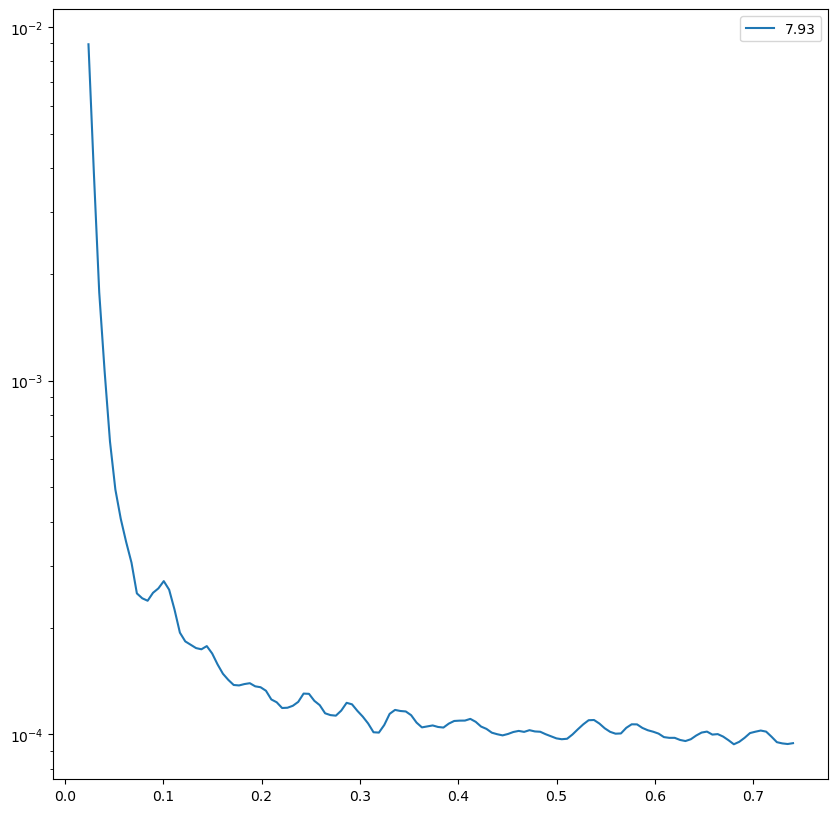

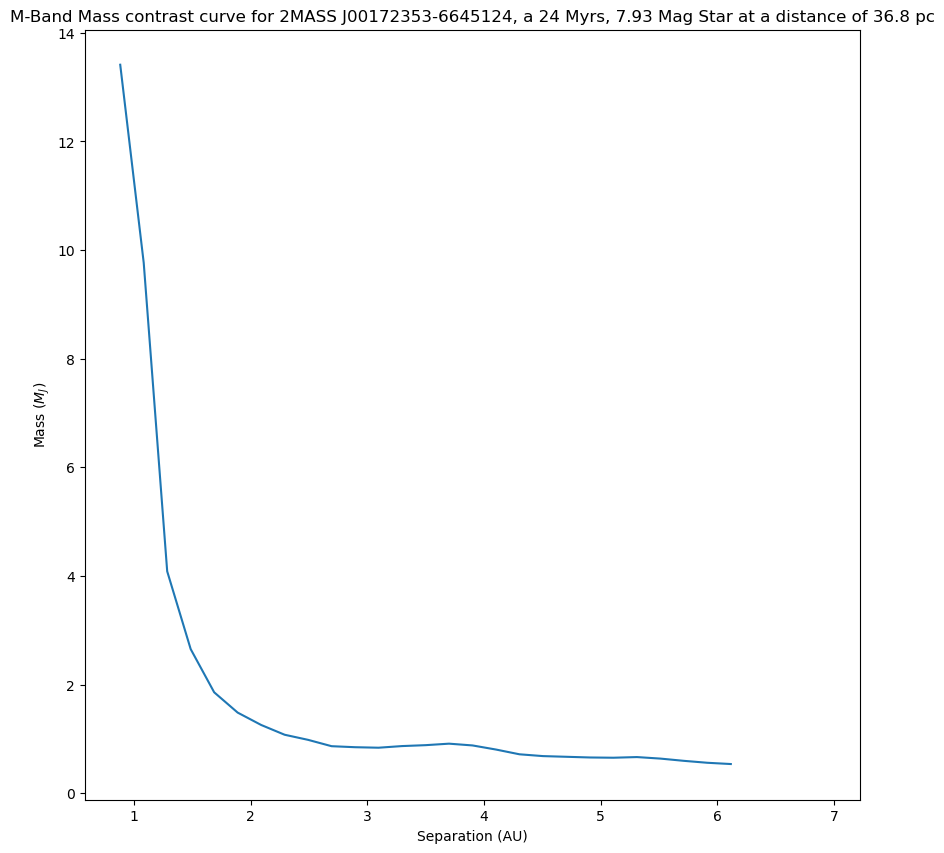

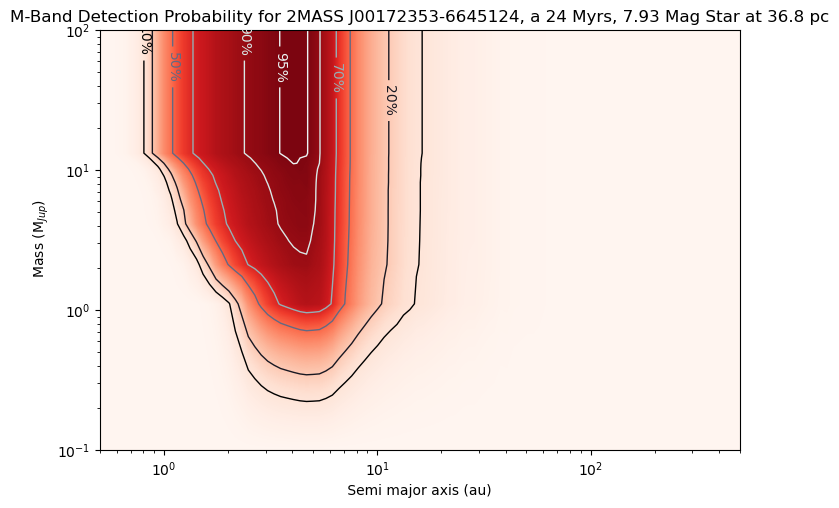

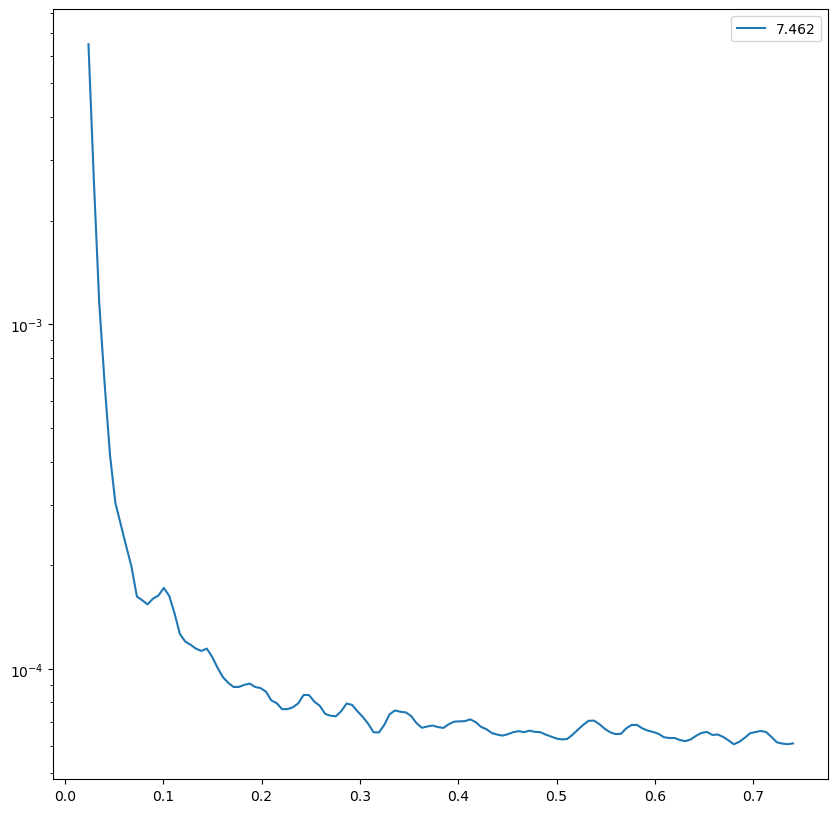

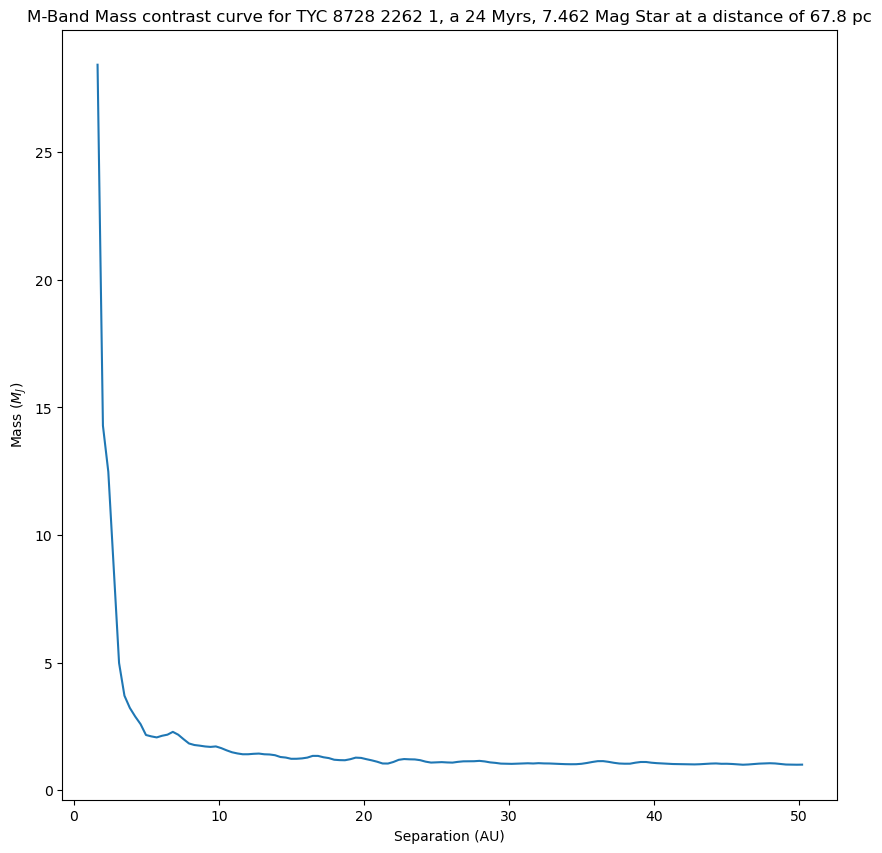

...

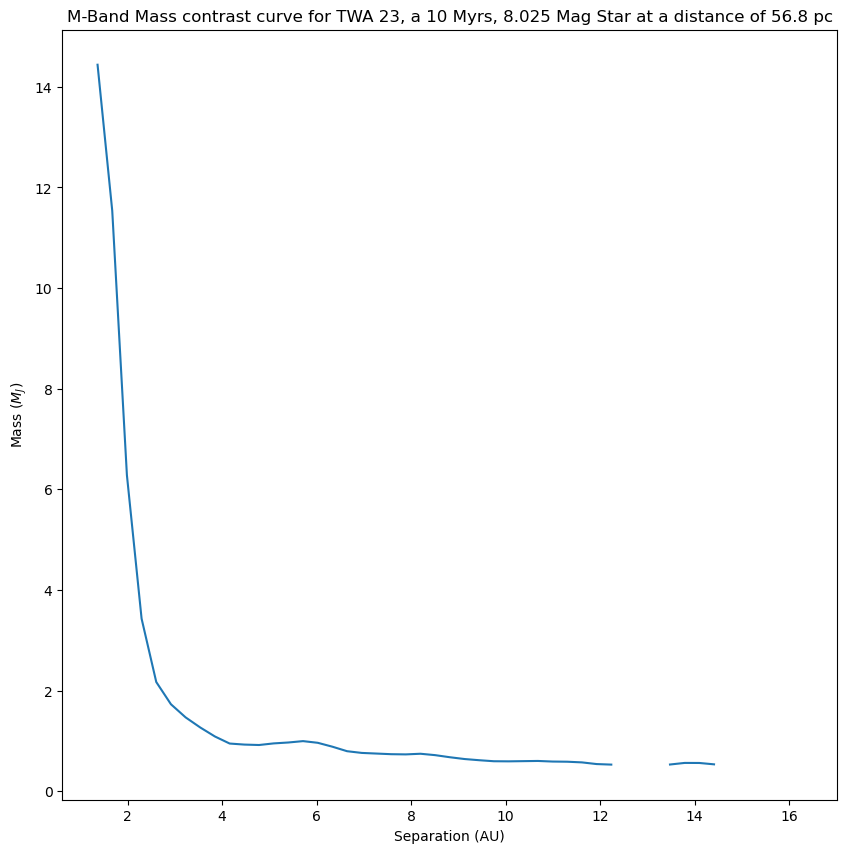

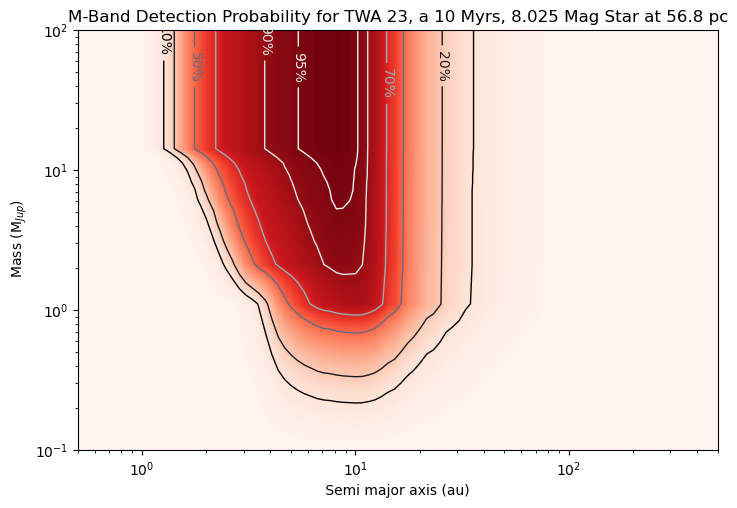

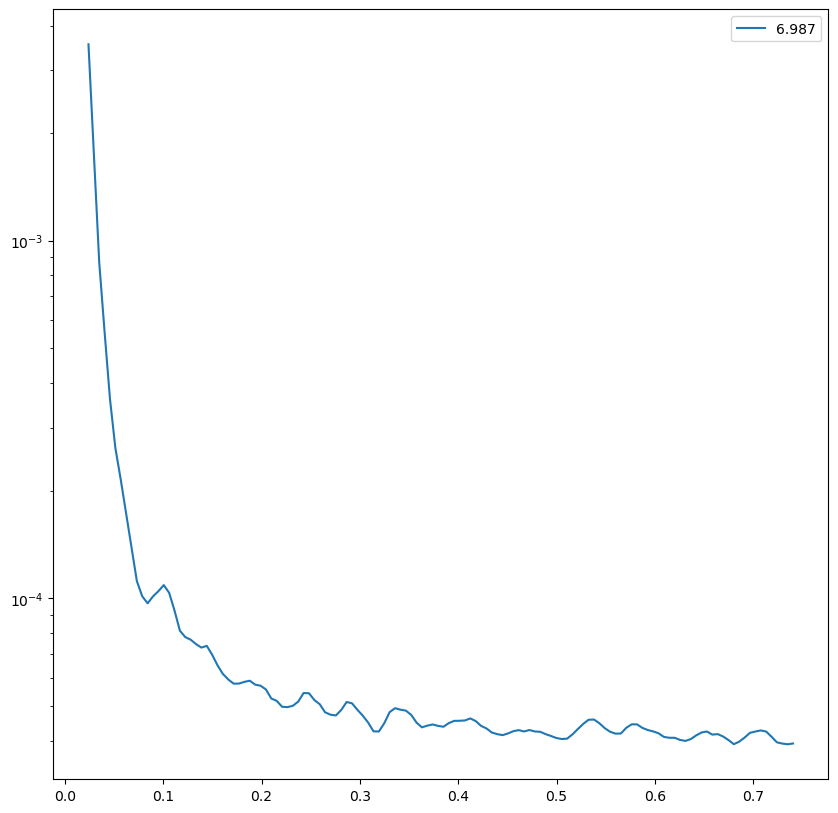

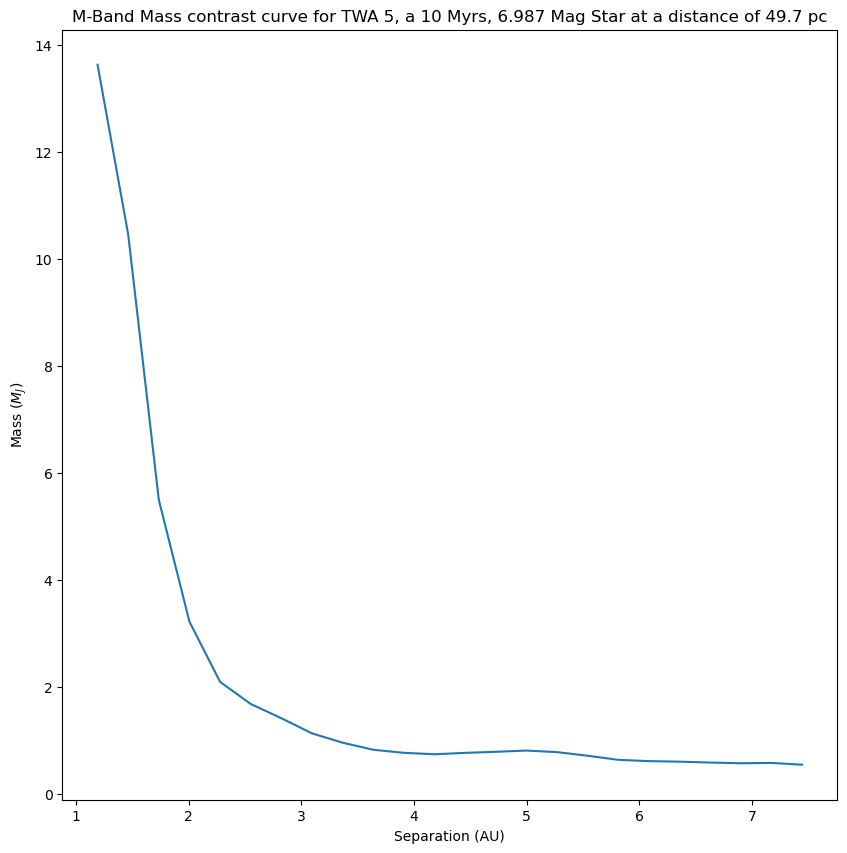

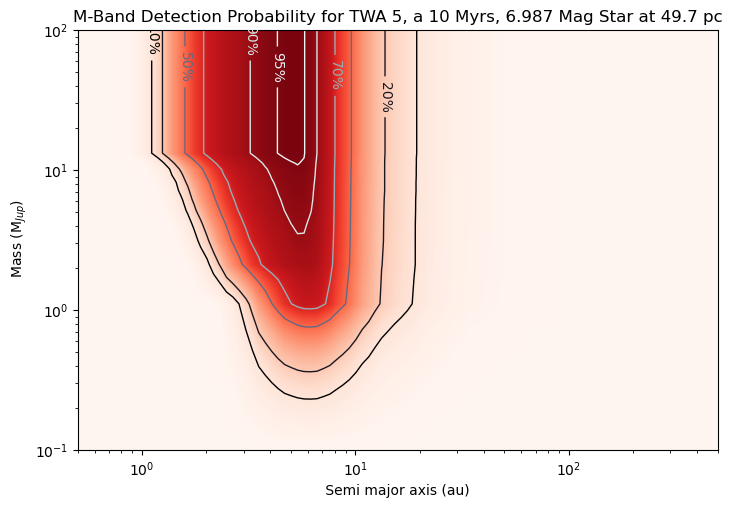

In [24]:
det.plot(model, model_tag, foldername, file_list, file_mag_list, distance, age, stellar_mag_list, filter_name_list, band_list, savefolder, star_list = star_list, xmin = 0.5, xmax = 500, logx = True)

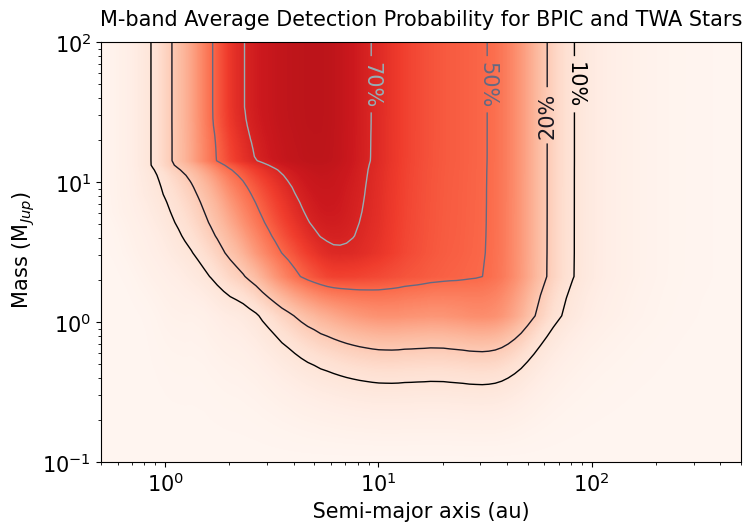

In [26]:
d = 0
for i in star_list:
    d += np.array(np.genfromtxt('C:/Users/bryce/High_Contrast_Imaging/METIS_2024/bpic_twa_M-with_close/{}_MKO_Mp_band_detprob.txt'.format(i)))
map = d/len(star_list)

savefilename = 'average_BPIC_TWA_MKO_Mp_band-with_close'
savefolder = 'C:/Users/bryce/High_Contrast_Imaging/METIS_2024/average/'

fig = plt.figure(figsize=(8, 6))

sma = np.geomspace(0.5, 500, 100)
m2 = np.linspace(0.1, 100, 100)

ax = fig.add_axes([0.15, 0.15, 0.8, 0.7])
ax.set_xscale('log')
ax.set_yscale('log')
ax.set_ylabel(" Mass (M$_{Jup}$)", size = 15)
ax.set_xlabel(" Semi-major axis (au) ", size = 15)
#ax.grid(which = 'major', color = 'black')
#ax.grid(which = 'minor', color = 'gray', linestyle = '--')

levels=[10,20,50,70,90,95,99,100]
norm = mcolors.Normalize(0, 100)
cf0=ax.contourf(sma, m2, map.T*100, norm=norm, levels=np.arange(0,100,0.1), extend='neither', cmap='Reds', antialiased=False, zorder=0)
contours = plt.contour(sma, m2, map.T*100, levels, cmap='bone', zorder=1, linewidths=1)
locations = [(100,50),(70,30),(40,50),(8,50)]
ax.clabel(contours, contours.levels, fmt = {10:'10%',20:'20%',50:'50%',70:'70%',90:'90%',95:'95%',99:'99%',100:'100%'}, inline=True, fontsize=15, manual = locations)
ax.set_title('M-band Average Detection Probability for BPIC and TWA Stars', size = 15, y = 1.02)
ax.tick_params(axis='both', which='major', labelsize=15)
plt.savefig(str(savefolder)+'/'+str(savefilename)+'_detprob.png', bbox_inches='tight')

In [22]:
import os
import matplotlib.pyplot as plt
import pickle
import numpy as np

with open("C:/Users/bryce/High_Contrast_Imaging/F150_lim.pkl", "rb") as f:
    obj = pickle.load(f)
STAR = obj["ID"]
STAR[59]
star_list = []
obj.keys()
for i in range(len(obj["ID"])):
    if obj['MGroup'][i] == 'BPIC' or obj['MGroup'][i] == 'TWA':
        if float(obj['Mstar'][i]) > 6.6 and float(obj['Mstar'][i]) < 8.6:
            star_list.append(i)
len(star_list)
if float(obj['Mstar'][4]) > 1 and float(obj['Mstar'][4]) < 2:
    print('yes')
print(obj['ID'][106])

yes
HIP_86598


SHINE Detection Probability for 2MASS_J00172353-6645124 time elapsed - 00:00:01.86
SHINE Detection Probability for TYC_8728_2262_1 time elapsed - 00:00:01.81
SHINE Detection Probability for HIP_86598 time elapsed - 00:00:01.80
SHINE Detection Probability for HIP_89829 time elapsed - 00:00:01.83
SHINE Detection Probability for TYC_9073_0762_1 time elapsed - 00:00:01.80
SHINE Detection Probability for TYC_7408_0054_1 time elapsed - 00:00:01.88
SHINE Detection Probability for TYC_7443_1102_1 time elapsed - 00:00:01.90
SHINE Detection Probability for 2MASS_J20013718-3313139 time elapsed - 00:00:01.85
SHINE Detection Probability for TYC_9340_0437_1 time elapsed - 00:00:01.89
SHINE Detection Probability for HIP_112312 time elapsed - 00:00:01.97
SHINE Detection Probability for TWA_6 time elapsed - 00:00:01.92
SHINE Detection Probability for CE_Ant time elapsed - 00:00:01.88


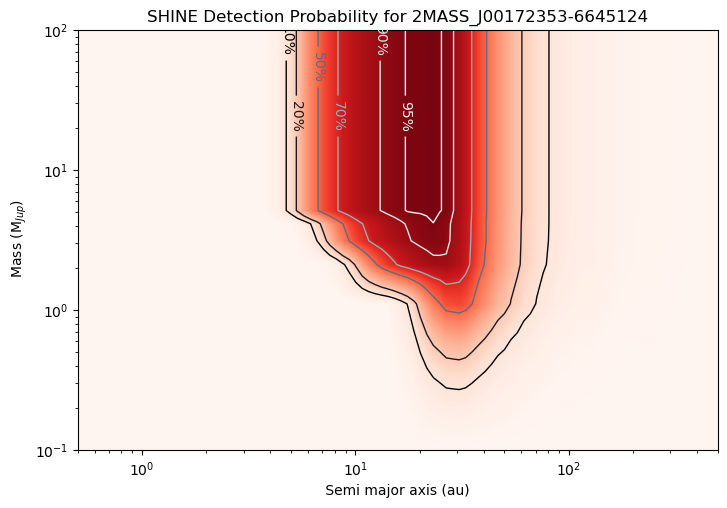

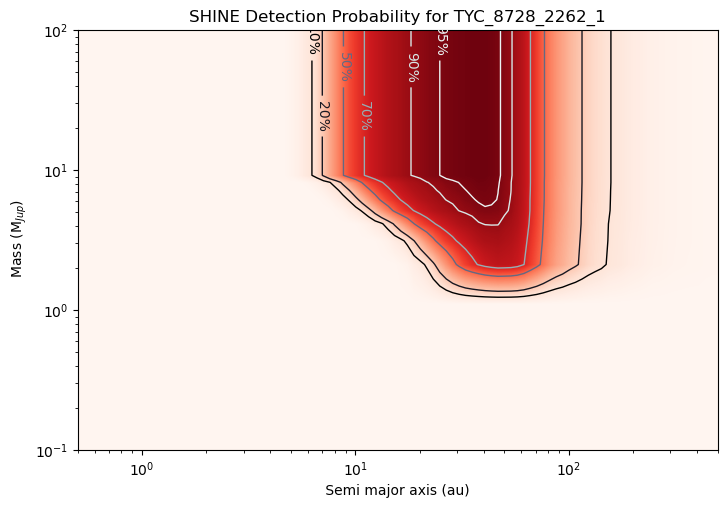

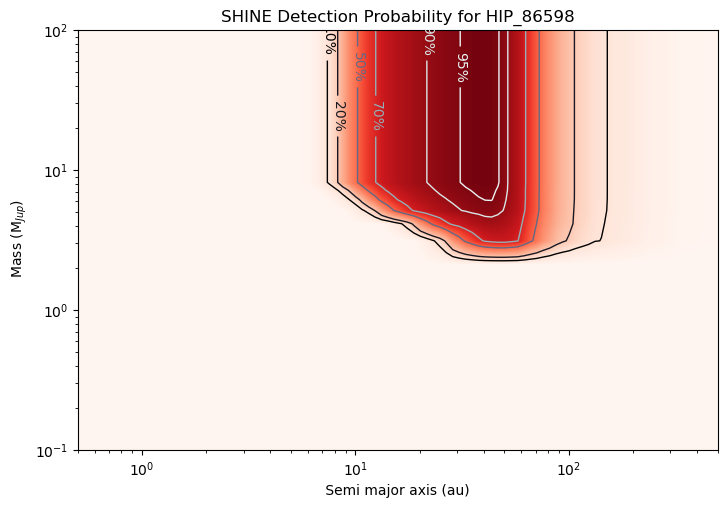

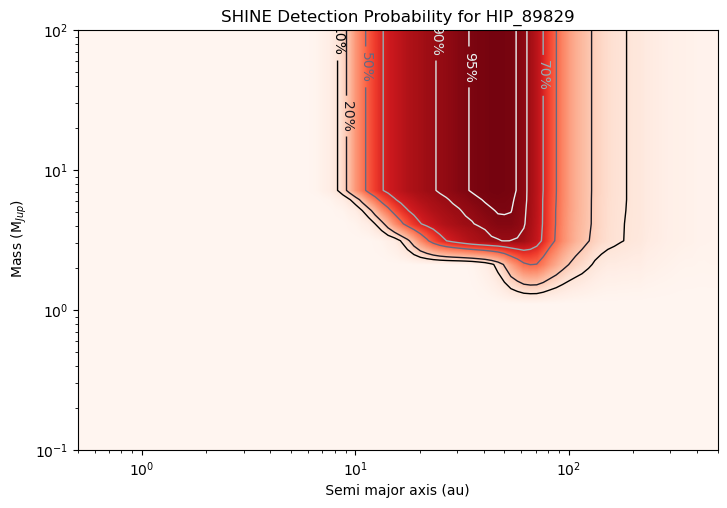

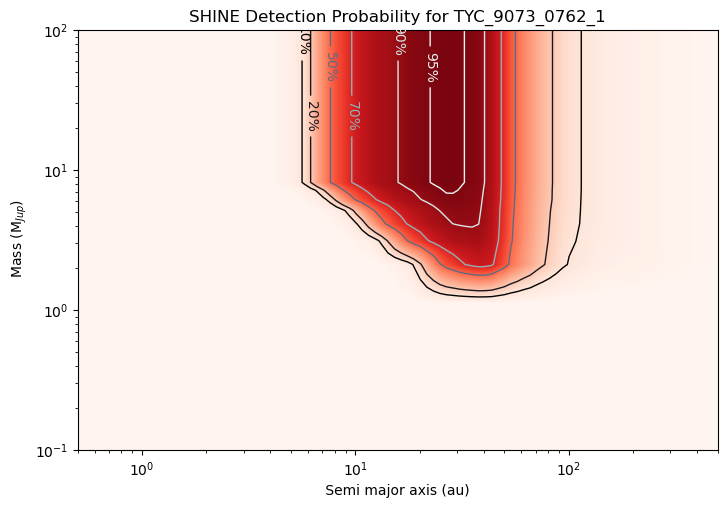

...

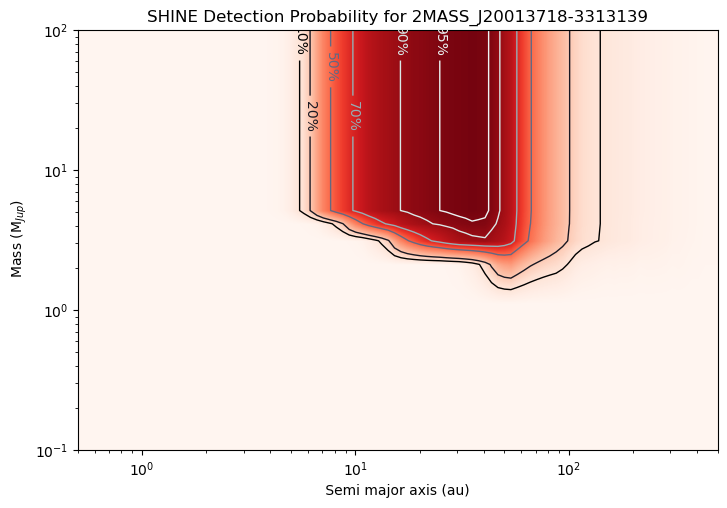

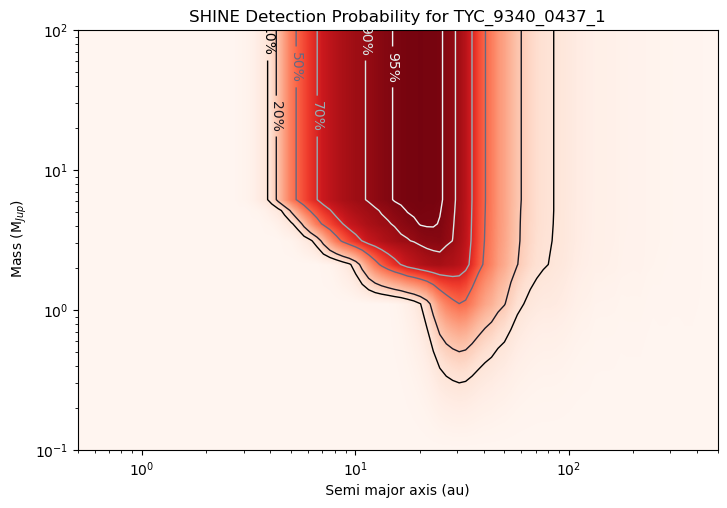

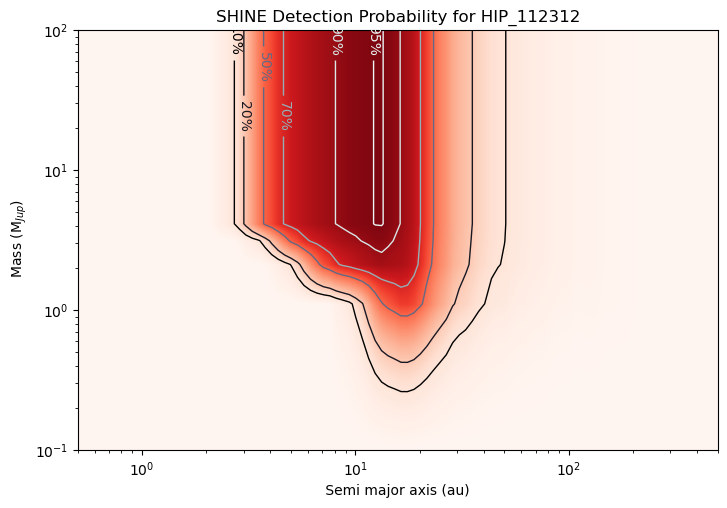

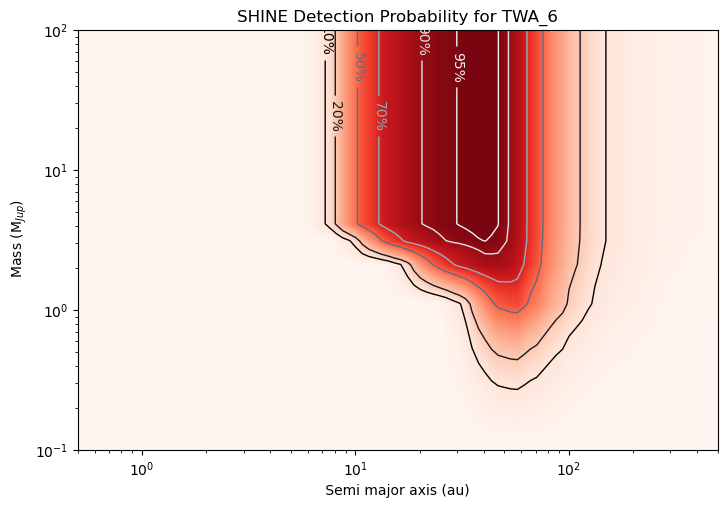

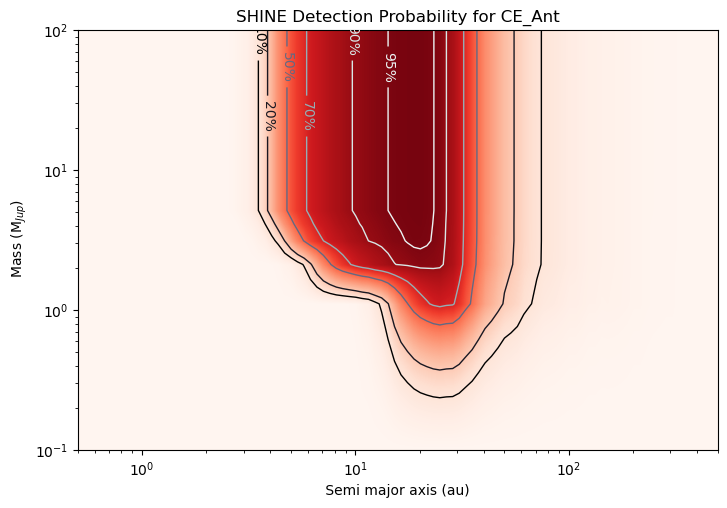

In [23]:
from exo_dmc_custom import *

savefolder = "C:/Users/bryce/High_Contrast_Imaging/METIS_2024/SHINE"
star_list = [3,
103,
106,
108,
110,
111,
122,
126,
140,
141,
55,
58,]
STAR = obj["ID"]
for i in range(len(star_list)):
    distance = float(obj["dist"][star_list[i]])
    x = obj["xlim"][star_list[i]] * distance
    y = obj["ylim"][star_list[i]]
    savefilename = i
    ID='SHINE Detection Probability for {}'.format(STAR[star_list[i]])
    dist = distance
    map=exodmc(ID, dist)
    map.set_grid(x_min=0.5, x_max=500, logx=True, y_min=0.1, y_max=100)
    xlim=x
    ylim=y
    prob = map.DImode(xlim, ylim, lxunit = 'au', savefig = False)
    det_prob = os.path.join(savefolder, str(savefilename)+'_detprob.txt')
    np.savetxt(det_prob, prob[0])

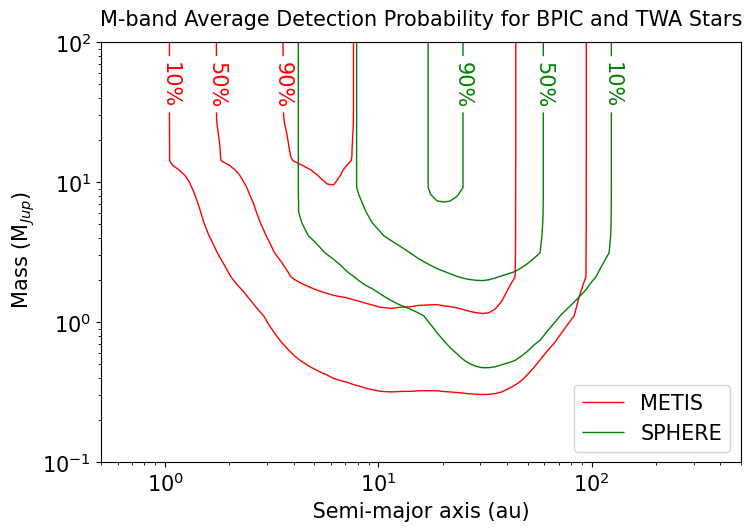

In [35]:
star_list = ['2MASS J00172353-6645124',
'TYC 8728 2262 1',
'HIP 86598',
'HIP 89829',
'TYC 9073 0762 1',
'TYC 7408 0054 1',
'TYC 7443 1102 1',
'2M J2001-3313',
'TYC 9340 0437 1',
#'HIP 112312',
'TWA 6',
#'TWA 7',
#'TYC_5832_0666_1',
'HIP 29964',
'HD 286264',
'TWA 25',
'TWA 23',
#'TWA 5'
]
d = 0
for i in star_list:
    d += np.array(np.genfromtxt('C:/Users/bryce/High_Contrast_Imaging/METIS_2024/bpic_twa_M/{}_MKO_Mp_band_detprob.txt'.format(i)))
map = d/len(star_list)
d = 0
for i in range(12):
    d += np.array(np.genfromtxt("C:/Users/bryce/High_Contrast_Imaging/METIS_2024/SHINE/{}_detprob.txt".format(i)))
mip = d/12

savefilename = 'average_BPIC_TWA_MKO_Mp_band_compare'
savefolder = 'C:/Users/bryce/High_Contrast_Imaging/METIS_2024/average/'

fig = plt.figure(figsize=(8, 6))

sma = np.geomspace(0.5, 500, 100)
m2 = np.linspace(0.1, 100, 100)

ax = fig.add_axes([0.15, 0.15, 0.8, 0.7])
ax.set_xscale('log')
ax.set_yscale('log')
ax.set_ylabel(" Mass (M$_{Jup}$)", size = 15)
ax.set_xlabel(" Semi-major axis (au) ", size = 15)
#ax.grid(which = 'major', color = 'black')
#ax.grid(which = 'minor', color = 'gray', linestyle = '--')

levels=[10,50,90,99]
norm = mcolors.Normalize(0, 100)
#cf0=ax.contourf(sma, m2, map.T*100, norm=norm, levels=np.arange(0,100,0.1), extend='neither', cmap='Reds', antialiased=False, zorder=0)
contours = plt.contour(sma, m2, map.T*100, levels, colors = 'red', zorder=1, linewidths=1)
locations = [(1,50),(2,50),(4,50)]
ax.clabel(contours, contours.levels, fmt = {10:'10%',20:'20%',50:'50%',70:'70%',90:'90%',95:'95%',99:'99%',100:'100%'}, inline=True, fontsize=15, manual = locations)

contours2 = plt.contour(sma, m2, mip.T*100, levels, colors='green', zorder=1, linewidths=1)
locations2 = [(200,50),(70,50),(30,50)]
ax.clabel(contours2, contours2.levels, fmt = {10:'10%',20:'20%',50:'50%',70:'70%',90:'90%',95:'95%',99:'99%',100:'100%'}, inline=True, fontsize=15, manual = locations2)

h1,_ = contours.legend_elements()
h2,_ = contours2.legend_elements()
ax.legend([h1[0], h2[0]], ['METIS','SPHERE'], loc = 'lower right', fontsize = 15)
ax.set_title('M-band Average Detection Probability for BPIC and TWA Stars', size = 15, y = 1.02)
ax.tick_params(axis='both', which='major', labelsize=15)
plt.savefig(str(savefolder)+'/'+str(savefilename)+'_detprob.png', bbox_inches='tight')

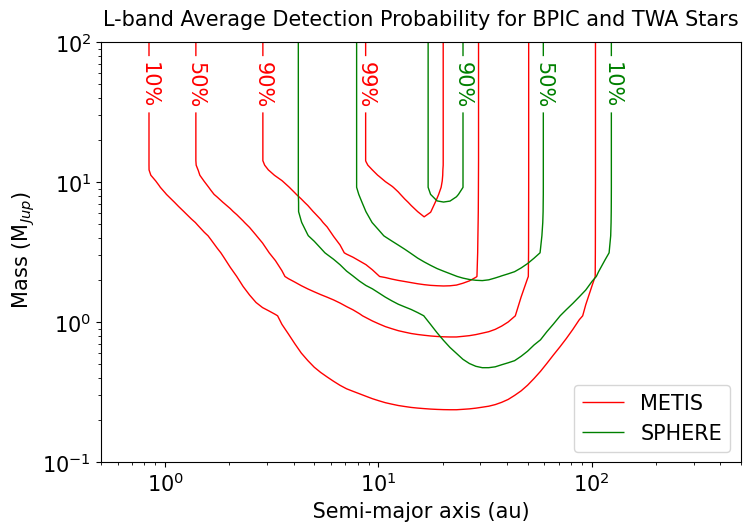

In [34]:
star_list = ['2MASS J00172353-6645124',
'TYC 8728 2262 1',
'HIP 86598',
'HIP 89829',
'TYC 9073 0762 1',
'TYC 7408 0054 1',
'TYC 7443 1102 1',
'2M J2001-3313',
'TYC 9340 0437 1',
#'HIP 112312',
'TWA 6',
#'TWA 7',
#'TYC_5832_0666_1',
'HIP 29964',
'HD 286264',
'TWA 25',
'TWA 23',
#'TWA 5'
]
d = 0
for i in star_list:
    d += np.array(np.genfromtxt('C:/Users/bryce/High_Contrast_Imaging/METIS_2024/bpic_twa_L/{}_MKO_Lp_band_detprob.txt'.format(i)))
map = d/len(star_list)
d = 0
for i in range(12):
    d += np.array(np.genfromtxt("C:/Users/bryce/High_Contrast_Imaging/METIS_2024/SHINE/{}_detprob.txt".format(i)))
mip = d/12

savefilename = 'average_BPIC_TWA_MKO_Lp_band_compare'
savefolder = 'C:/Users/bryce/High_Contrast_Imaging/METIS_2024/average/'

fig = plt.figure(figsize=(8, 6))

sma = np.geomspace(0.5, 500, 100)
m2 = np.linspace(0.1, 100, 100)

ax = fig.add_axes([0.15, 0.15, 0.8, 0.7])
ax.set_xscale('log')
ax.set_yscale('log')
ax.set_ylabel(" Mass (M$_{Jup}$)", size = 15)
ax.set_xlabel(" Semi-major axis (au) ", size = 15)
#ax.grid(which = 'major', color = 'black')
#ax.grid(which = 'minor', color = 'gray', linestyle = '--')

levels=[10,50,90,99]
norm = mcolors.Normalize(0, 100)
#cf0=ax.contourf(sma, m2, map.T*100, norm=norm, levels=np.arange(0,100,0.1), extend='neither', cmap='Reds', antialiased=False, zorder=0)
contours = plt.contour(sma, m2, map.T*100, levels, colors = 'red', zorder=1, linewidths=1)
locations = [(1,50),(2,50),(4,50),(10,50)]
ax.clabel(contours, contours.levels, fmt = {10:'10%',20:'20%',50:'50%',70:'70%',90:'90%',95:'95%',99:'99%',100:'100%'}, inline=True, fontsize=15, manual = locations)

contours2 = plt.contour(sma, m2, mip.T*100, levels, colors='green', zorder=1, linewidths=1)
locations2 = [(200,50),(70,50),(30,50)]
ax.clabel(contours2, contours2.levels, fmt = {10:'10%',20:'20%',50:'50%',70:'70%',90:'90%',95:'95%',99:'99%',100:'100%'}, inline=True, fontsize=15, manual = locations2)

h1,_ = contours.legend_elements()
h2,_ = contours2.legend_elements()
ax.legend([h1[0], h2[0]], ['METIS','SPHERE'], loc = 'lower right', fontsize = 15)
ax.set_title('L-band Average Detection Probability for BPIC and TWA Stars', size = 15, y = 1.02)
ax.tick_params(axis='both', which='major', labelsize=15)
plt.savefig(str(savefolder)+'/'+str(savefilename)+'_detprob.png', bbox_inches='tight')

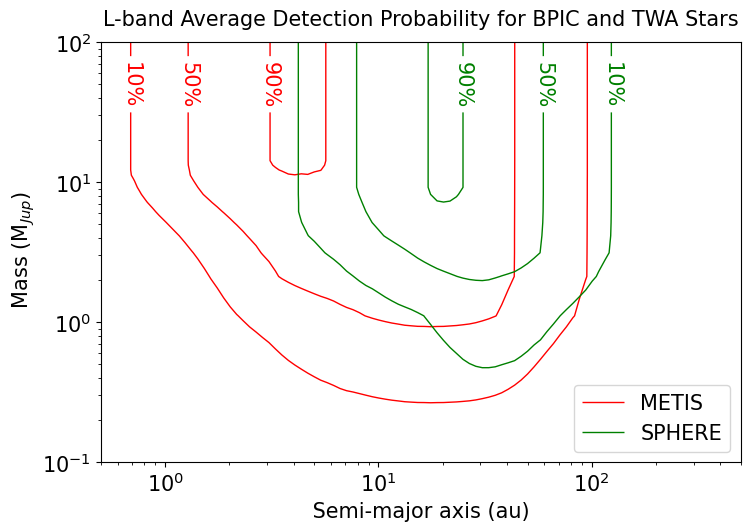

In [38]:
star_list = ['2MASS J00172353-6645124',
'TYC 8728 2262 1',
'HIP 86598',
'HIP 89829',
'TYC 9073 0762 1',
'TYC 7408 0054 1',
'TYC 7443 1102 1',
'2M J2001-3313',
'TYC 9340 0437 1',
'HIP 112312',
'TWA 6',
'TWA 7',
'TYC_5832_0666_1',
'HIP 29964',
'HD 286264',
'TWA 25',
'TWA 23',
'TWA 5'
]
d = 0
for i in star_list:
    d += np.array(np.genfromtxt('C:/Users/bryce/High_Contrast_Imaging/METIS_2024/bpic_twa_L-with_close/{}_MKO_Lp_band_detprob.txt'.format(i)))
map = d/len(star_list)
d = 0
for i in range(12):
    d += np.array(np.genfromtxt("C:/Users/bryce/High_Contrast_Imaging/METIS_2024/SHINE/{}_detprob.txt".format(i)))
mip = d/12

savefilename = 'average_BPIC_TWA_MKO_Lp_band-with_close_compare'
savefolder = 'C:/Users/bryce/High_Contrast_Imaging/METIS_2024/average/'

fig = plt.figure(figsize=(8, 6))

sma = np.geomspace(0.5, 500, 100)
m2 = np.linspace(0.1, 100, 100)

ax = fig.add_axes([0.15, 0.15, 0.8, 0.7])
ax.set_xscale('log')
ax.set_yscale('log')
ax.set_ylabel(" Mass (M$_{Jup}$)", size = 15)
ax.set_xlabel(" Semi-major axis (au) ", size = 15)
#ax.grid(which = 'major', color = 'black')
#ax.grid(which = 'minor', color = 'gray', linestyle = '--')

levels=[10,50,90,99]
norm = mcolors.Normalize(0, 100)
#cf0=ax.contourf(sma, m2, map.T*100, norm=norm, levels=np.arange(0,100,0.1), extend='neither', cmap='Reds', antialiased=False, zorder=0)
contours = plt.contour(sma, m2, map.T*100, levels, colors = 'red', zorder=1, linewidths=1)
locations = [(1,50),(2,50),(0.7,50)]
ax.clabel(contours, contours.levels, fmt = {10:'10%',20:'20%',50:'50%',70:'70%',90:'90%',95:'95%',99:'99%',100:'100%'}, inline=True, fontsize=15, manual = locations)

contours2 = plt.contour(sma, m2, mip.T*100, levels, colors='green', zorder=1, linewidths=1)
locations2 = [(200,50),(70,50),(30,50)]
ax.clabel(contours2, contours2.levels, fmt = {10:'10%',20:'20%',50:'50%',70:'70%',90:'90%',95:'95%',99:'99%',100:'100%'}, inline=True, fontsize=15, manual = locations2)

h1,_ = contours.legend_elements()
h2,_ = contours2.legend_elements()
ax.legend([h1[0], h2[0]], ['METIS','SPHERE'], loc = 'lower right', fontsize = 15)
ax.set_title('L-band Average Detection Probability for BPIC and TWA Stars', size = 15, y = 1.02)
ax.tick_params(axis='both', which='major', labelsize=15)
plt.savefig(str(savefolder)+'/'+str(savefilename)+'_detprob.png', bbox_inches='tight')

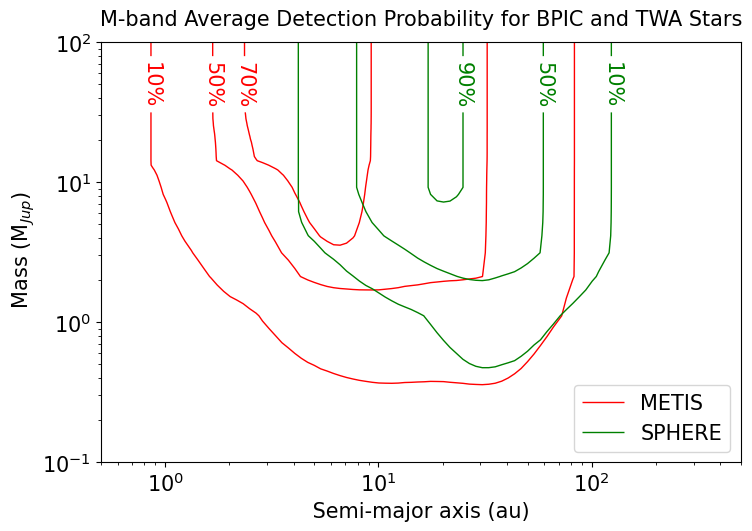

In [41]:
star_list = ['2MASS J00172353-6645124',
'TYC 8728 2262 1',
'HIP 86598',
'HIP 89829',
'TYC 9073 0762 1',
'TYC 7408 0054 1',
'TYC 7443 1102 1',
'2M J2001-3313',
'TYC 9340 0437 1',
'HIP 112312',
'TWA 6',
'TWA 7',
'TYC_5832_0666_1',
'HIP 29964',
'HD 286264',
'TWA 25',
'TWA 23',
'TWA 5'
]
d = 0
for i in star_list:
    d += np.array(np.genfromtxt('C:/Users/bryce/High_Contrast_Imaging/METIS_2024/bpic_twa_M-with_close/{}_MKO_Mp_band_detprob.txt'.format(i)))
map = d/len(star_list)
d = 0
for i in range(12):
    d += np.array(np.genfromtxt("C:/Users/bryce/High_Contrast_Imaging/METIS_2024/SHINE/{}_detprob.txt".format(i)))
mip = d/12

savefilename = 'average_BPIC_TWA_MKO_Mp_band-with_close_compare'
savefolder = 'C:/Users/bryce/High_Contrast_Imaging/METIS_2024/average/'

fig = plt.figure(figsize=(8, 6))

sma = np.geomspace(0.5, 500, 100)
m2 = np.linspace(0.1, 100, 100)

ax = fig.add_axes([0.15, 0.15, 0.8, 0.7])
ax.set_xscale('log')
ax.set_yscale('log')
ax.set_ylabel(" Mass (M$_{Jup}$)", size = 15)
ax.set_xlabel(" Semi-major axis (au) ", size = 15)
#ax.grid(which = 'major', color = 'black')
#ax.grid(which = 'minor', color = 'gray', linestyle = '--')

levels=[10,50,90,99]
norm = mcolors.Normalize(0, 100)
#cf0=ax.contourf(sma, m2, map.T*100, norm=norm, levels=np.arange(0,100,0.1), extend='neither', cmap='Reds', antialiased=False, zorder=0)
contours = plt.contour(sma, m2, map.T*100, [10,50,70], colors = 'red', zorder=1, linewidths=1)
locations = [(1,50),(2,50),(1.5,50)]
ax.clabel(contours, contours.levels, fmt = {10:'10%',20:'20%',50:'50%',70:'70%',90:'90%',95:'95%',99:'99%',100:'100%'}, inline=True, fontsize=15, manual = locations)

contours2 = plt.contour(sma, m2, mip.T*100, levels, colors='green', zorder=1, linewidths=1)
locations2 = [(200,50),(70,50),(30,50)]
ax.clabel(contours2, contours2.levels, fmt = {10:'10%',20:'20%',50:'50%',70:'70%',90:'90%',95:'95%',99:'99%',100:'100%'}, inline=True, fontsize=15, manual = locations2)

h1,_ = contours.legend_elements()
h2,_ = contours2.legend_elements()
ax.legend([h1[0], h2[0]], ['METIS','SPHERE'], loc = 'lower right', fontsize = 15)
ax.set_title('M-band Average Detection Probability for BPIC and TWA Stars', size = 15, y = 1.02)
ax.tick_params(axis='both', which='major', labelsize=15)
plt.savefig(str(savefolder)+'/'+str(savefilename)+'_detprob.png', bbox_inches='tight')